# load data

In [4]:
%load_ext autoreload
%autoreload 2
import SimpleITK as sitk
import matplotlib.pyplot as plt
import pandas as pd
from scipy import ndimage
import numpy as np
import os
import sys
sys.path.append("/files")
from calculate_bbox_metrics import calculate_bbox_metrics
from data import get_data
import metrics
import generator
import math
from pprint import pprint
from archive.metrics_binary import precision, recall, jaccard, dice, segmentation_score
from time import time

data.csv shape ::  (873, 13)
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# get data

In [20]:
model_input_size = (64, 160, 160)
# data_train_tune = get_data("train_tune", model_input_size, "SEGMENTATION")
data_test = get_data("test", model_input_size, "SEGMENTATION", MULTI_PREDICTION=False)

414_harvard-rt_1001-TC325
422_harvard-rt_1023-TC371
test cases :: 2
test image shape :: (1, 64, 160, 160)


In [21]:
data_test = get_data("test", model_input_size, "SEGMENTATION", MULTI_PREDICTION=True)

414_harvard-rt_1001-TC325
422_harvard-rt_1023-TC371
test cases :: 2
test image shape :: (76, 196, 196)


20


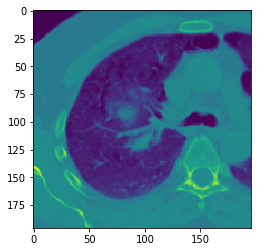

21


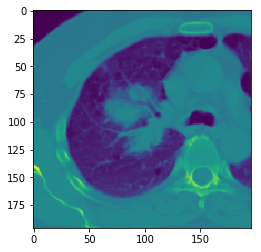

22


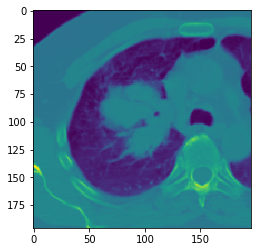

23


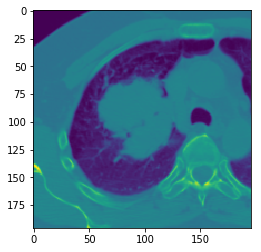

24


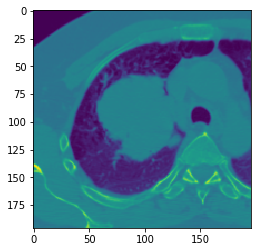

25


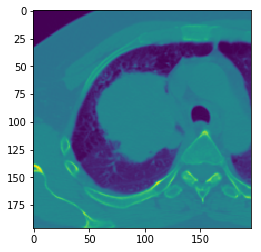

26


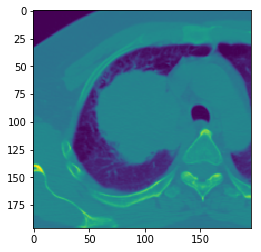

27


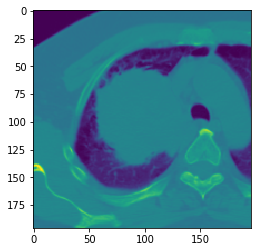

28


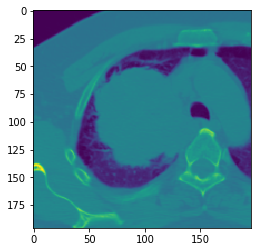

29


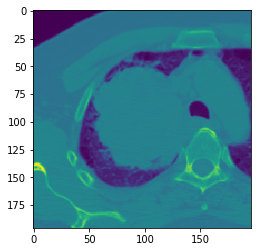

30


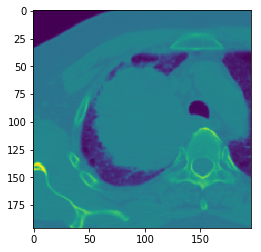

31


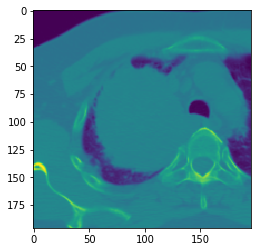

32


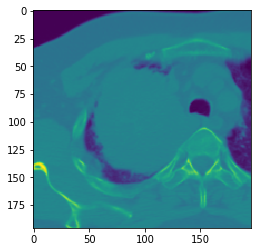

33


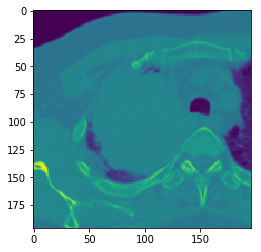

34


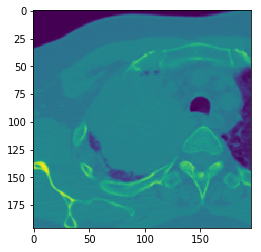

35


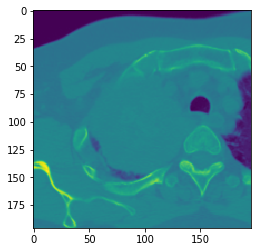

36


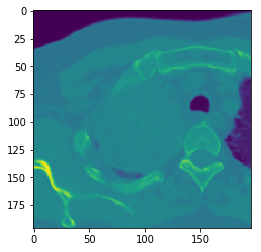

37


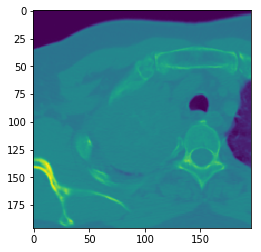

38


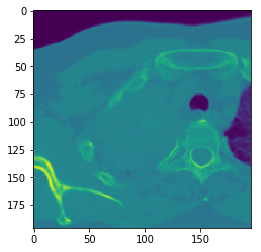

39


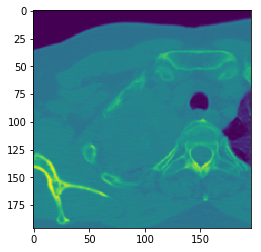

40


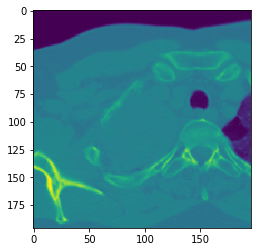

41


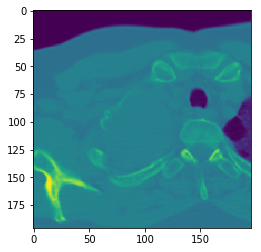

42


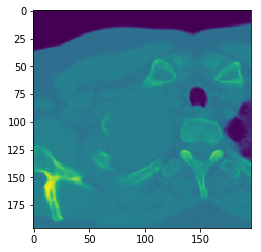

43


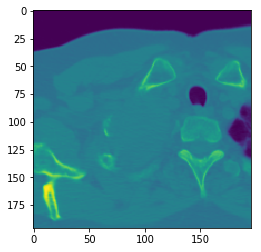

44


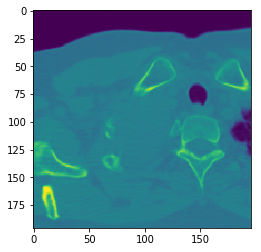

45


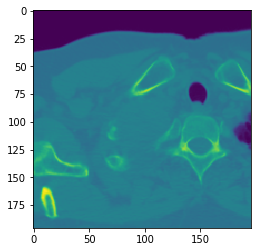

46


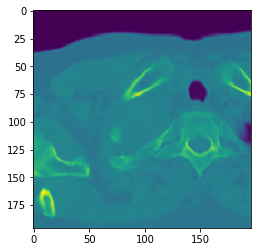

47


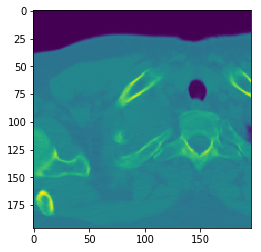

48


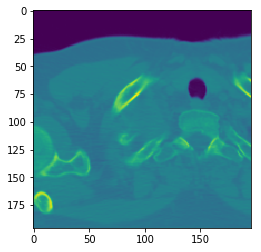

49


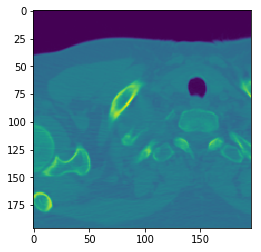

50


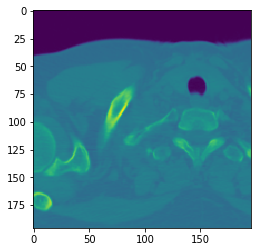

51


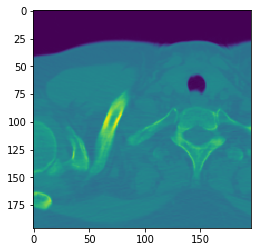

52


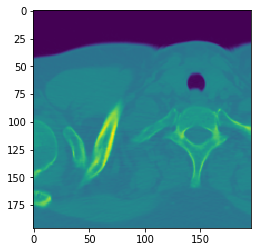

53


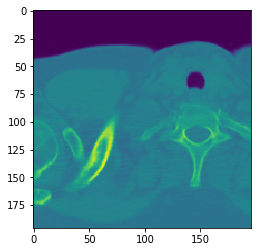

54


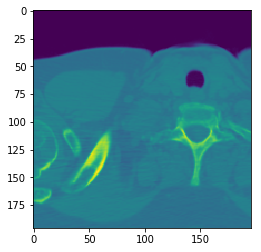

55


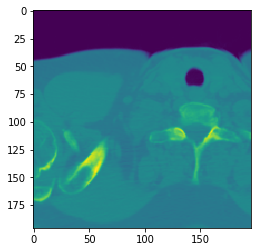

56


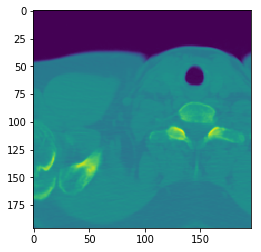

57


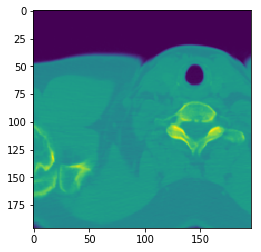

58


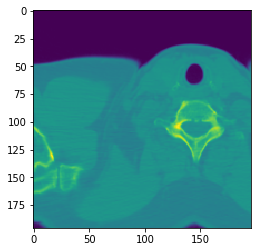

59


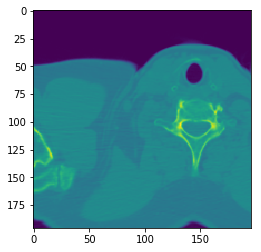

In [40]:
# test
for i in range(20,60):
    p = 0
#     i=30
    print (i)
    plt.imshow(data_test[p]["image"][i, :, :])
#     plt.imshow(sitk.GetArrayFromImage(data_test[p]["label_sitk_obj"])[i, :, :], alpha = 0.1)
    plt.show()

In [36]:
data_test[0]["image"].max()

0.6136752136752137

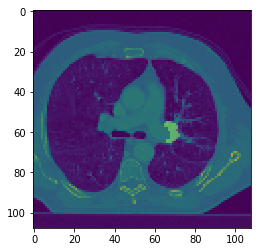

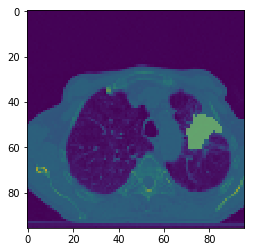

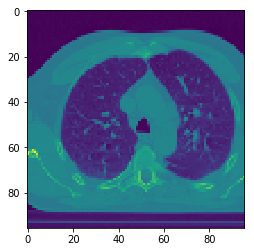

In [22]:
# train
p = 4
i=48
plt.imshow(data_train_tune["train"]["images"][p, i, :, :])
plt.imshow(data_train_tune["train"]["labels"][p, i, :, :], alpha = 0.3)
plt.show()

# tune
p = 1
i=55
plt.imshow(data_train_tune["tune"]["images"][p, 0, i, :, :])
plt.imshow(data_train_tune["tune"]["labels"][p, 0, i, :, :], alpha = 0.3)
plt.show()

# test
p = 1
i=50
plt.imshow(data_test[p]["image"][0, i, :, :])
plt.imshow(data_test[p]["label"][0, i, :, :], alpha = 0.3)
plt.show()

In [23]:
len(data_train_tune["train"]["images"])

330

In [ ]:
 if add_noise and np.random.randint(3) == 0:
        # Add uncorrelated gaussian pixel noise with random variance (1,200)
        fluc = np.random.randint(1,200)
        cur_img = np.random.normal(cur_img,fluc)
        cur_img *= (cur_img>0)
        cur_img = np.round(cur_img).astype( dtype=np.float32)

In [25]:
np.interp(125,[-1024,3071],[0,1]) - np.interp(100,[-1024,3071],[0,1])

0.006105006105006083

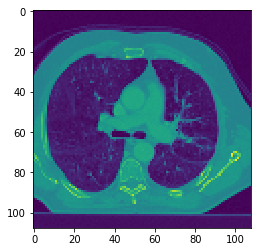

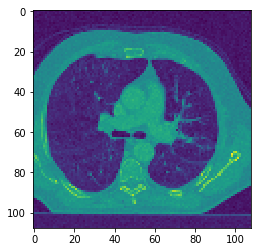

In [33]:
p = 4
i=48

original = data_train_tune["train"]["images"][p]
plt.imshow(original[i, :, :])
plt.show()

new = original + np.random.normal(0, 0.0061, (84,108,108))
plt.imshow(new[i, :, :])
plt.show()

In [35]:
25/0.006105006105006083

4095.0000000000146

# multi predictions

In [95]:
arr1 =np.full((8,6,4), 1)
arr2 =np.full((8,6,4), 1)
arr3 =np.full((8,6,4), 1)
arr4 =np.full((8,6,4), 1)
arr5 =np.full((8,6,4), 1)
arr6 =np.full((8,6,4), 1)
arr7 =np.full((8,6,4), 1)
arr8 =np.full((8,6,4), 1)
arr9 =np.full((8,6,4), 1)

pred_outs = [arr1, arr2, arr3, arr4, arr5, arr6, arr7, arr8, arr9]

In [136]:
combined_label = np.zeros((10,8,6))
org = combined_label # rom sitk object
pred = arr1 # input to model

z_diff = org.shape[0] - pred.shape[0]
y_diff = org.shape[1] - pred.shape[1]
x_diff = org.shape[2] - pred.shape[2]

offsets = [
    # counter clockwise on top
    {"z":0,
     "y":0,
     "x":0
    },
    {"z":0,
     "y":y_diff,
     "x":0
    }, 
    {"z":0,
     "y":y_diff,
     "x":x_diff
    },  
    {"z":0,
     "y":0,
     "x":x_diff
    },  
    # central
    {"z":z_diff//2,
     "y":y_diff//2,
     "x":x_diff//2
    },  
    # counter clockwise on bottom 
    {"z":z_diff,
     "y":0,
     "x":0
    },
    {"z":z_diff,
     "y":y_diff,
     "x":0
    }, 
    {"z":z_diff,
     "y":y_diff,
     "x":x_diff
    },  
    {"z":z_diff,
     "y":0,
     "x":x_diff
    }
]

for offset, pred in zip(offsets, pred_outs):
    Z = offset["z"]
    Y = offset["y"]
    X = offset["x"]
    to_predict_on = org[Z:(Z+pred.shape[0]), Y:(Y+pred.shape[1]), X:(X+pred.shape[2])]
    # run prediction
    combined_label[Z:(Z+pred.shape[0]), Y:(Y+pred.shape[1]), X:(X+pred.shape[2])] += pred
combined_label /= 9 


In [138]:
combined_label[2]


array([[0.22222222, 0.22222222, 0.44444444, 0.44444444, 0.22222222,
        0.22222222],
       [0.22222222, 0.33333333, 0.55555556, 0.55555556, 0.33333333,
        0.22222222],
       [0.44444444, 0.55555556, 1.        , 1.        , 0.55555556,
        0.44444444],
       [0.44444444, 0.55555556, 1.        , 1.        , 0.55555556,
        0.44444444],
       [0.44444444, 0.55555556, 1.        , 1.        , 0.55555556,
        0.44444444],
       [0.44444444, 0.55555556, 1.        , 1.        , 0.55555556,
        0.44444444],
       [0.22222222, 0.33333333, 0.55555556, 0.55555556, 0.33333333,
        0.22222222],
       [0.22222222, 0.22222222, 0.44444444, 0.44444444, 0.22222222,
        0.22222222]])

In [131]:
combined_label[2][4][3] / 9.0


0.013888888853039238

# test rotation and shear augmentations

## get original

In [94]:
arr.shape

(84, 108, 108)

In [81]:
np.unique(label)

array([0, 1], dtype=int16)

In [ ]:
# ndimage.zoom
# very slow ... 
# image needs to be recropped

# ndimage.rotate 
# 2x faster than ndimage.interpolation.affine_transform with rotation matrix

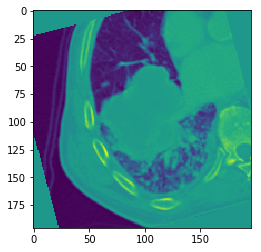

0.42784786224365234


In [118]:
start = time()
arrR = ndimage.rotate(arr, float(15), order=3, axes=(1,2), mode="constant", cval = 0, reshape=False)
plt.imshow(arrR[38])
plt.show()
print (time() - start)

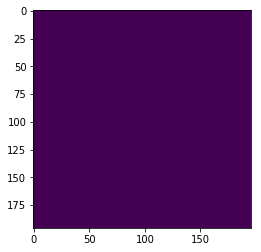

0.24323320388793945


In [129]:
start = time()
theta = np.deg2rad(15)
# rotation_matrix = np.array([[np.cos(theta), -np.sin(theta), 0],
#                             [np.sin(theta), np.cos(theta), 0],
#                             [0, 0, 1]])
rotation_matrix = np.array([[1,0,0],
                            [0, np.cos(theta), np.sin(theta)],
                            [0, -np.sin(theta), np.cos(theta)]])

offset = (np.array(arr.shape)[::-1]-1)/2.0
arr3 = ndimage.interpolation.affine_transform(arr, rotation_matrix, offset=offset)
plt.imshow(arr3[38])
plt.show()
print (time() - start)

In [5]:
def affine_transform(image, rmatrix, order=3, scale=1.0, image_center=None,
                     recenter=False, missing=0.0, use_scipy=False):

    rmatrix = rmatrix / scale
    array_center = (np.array(image.shape)[::-1]-1)/2.0

    # Make sure the image center is an array and is where it's supposed to be
    if image_center is not None:
        image_center = np.asanyarray(image_center)
    else:
        image_center = array_center
    
    print (image_center)
    # Determine center of rotation based on use (or not) of the recenter keyword
    if recenter:
        rot_center = array_center
    else:
        rot_center = image_center

    displacement = np.dot(rmatrix, rot_center)
    shift = image_center - displacement
    print (shift)

    if use_scipy or scikit_image_not_found:
        if np.any(np.isnan(image)):
            warnings.warn("Setting NaNs to 0 for SciPy rotation", RuntimeWarning)
        # Transform the image using the scipy affine transform
        rotated_image = ndimage.interpolation.affine_transform(
                np.nan_to_num(image).T, rmatrix, offset=shift, order=order,
                mode='constant', cval=missing).T

    return rotated_image

# START AFFINE TRANSFORMATION

0.6323375701904297
{'x_scale': 0.9225378048781463, 'z_scale': 1.042969080893348, 'x_rotation_angle': 0.011328885374872495, 'z_rotation_angle': -0.0018569978055070937, 'x_shear_angle': -0.027416500029276755, 'y_rotation_angle': -0.022396991229805357, 'y_shear_angle': -0.04971096150837103, 'z_shear_angle': 0.01802268154207716, 'y_scale': 0.8155489390401437}


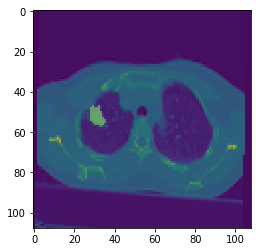

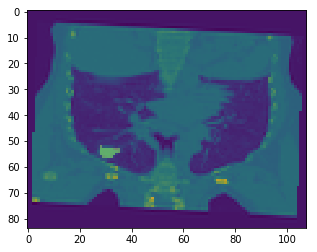

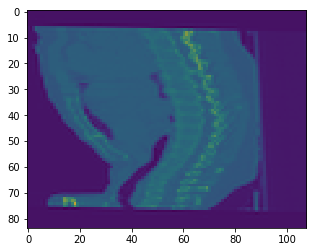

-1339 1667 int16
0 1 uint8
[0 1]


In [121]:
def get_rotation_matrix(z_angle, y_angle, x_angle):
    # https://en.wikipedia.org/wiki/Rotation_matrix

    # rotation in Z 
    rotation_matrix_z = np.array([[np.cos(z_angle), -np.sin(z_angle), 0],
                                  [np.sin(z_angle), np.cos(z_angle), 0],
                                  [0, 0, 1]])

    # rotation in Y
    rotation_matrix_y = np.array([[np.cos(y_angle), 0, np.sin(y_angle)],
                                  [0, 1, 0],
                                  [-np.sin(y_angle), 0, np.cos(y_angle)]])

    # rotation in X
    rotation_matrix_x = np.array([[1,0,0],
                                  [0, np.cos(x_angle), -np.sin(x_angle)],
                                  [0, np.sin(x_angle), np.cos(x_angle)]])
    
    # combine
    matrix = np.dot(rotation_matrix_z, rotation_matrix_y)
    matrix = np.dot(matrix, rotation_matrix_x)
    return matrix


def get_scale_matrix(z_scale, y_scale, x_scale):
    """
    For example, z_scale=5, y_scale=1, x_scale=1,
    will make the sagittal and coronal slices smaller and keep the axial untouched.  
    """
    return np.array([[x_scale, 0, 0],
                     [0, y_scale, 0],
                     [0, 0, z_scale]])

def get_shear_matrix(z_angle, y_angle, x_angle):
    # https://www.gatevidyalay.com/3d-shearing-in-computer-graphics-definition-examples/
        
    return np.array([[1, np.sin(x_angle), np.sin(x_angle)],
                     [np.sin(y_angle), 1, np.sin(y_angle)],
                     [np.sin(z_angle), np.sin(z_angle), 1]])


rot_ang_rng = 8
shr_ang_rng = 8
# reduces rotation and shear range for specific axes
red_rot_shr = 0.6
# +1 and -1
scale_range = 0.2

def get_affine_transformation_params():
    
    return {
         # + or -
        "z_rotation_angle": np.deg2rad(np.random.uniform(rot_ang_rng*-1, rot_ang_rng)),
        "y_rotation_angle": np.deg2rad(np.random.uniform(red_rot_shr*rot_ang_rng*-1, red_rot_shr*rot_ang_rng)), 
        "x_rotation_angle": np.deg2rad(np.random.uniform(red_rot_shr*rot_ang_rng*-1, red_rot_shr*rot_ang_rng)),
         # + or -
        "z_shear_angle": np.deg2rad(np.random.uniform(red_rot_shr*shr_ang_rng*-1, red_rot_shr*shr_ang_rng)), 
        "y_shear_angle": np.deg2rad(np.random.uniform(shr_ang_rng*-1, shr_ang_rng)),
        "x_shear_angle": np.deg2rad(np.random.uniform(shr_ang_rng*-1, shr_ang_rng)),
        # 0.8 to 1.2
        # <1 zooms in
        # >1 zooms out
        "z_scale": np.random.uniform(1-scale_range, 1+scale_range),
        "y_scale": np.random.uniform(1-scale_range, 1+scale_range),
        "x_scale": np.random.uniform(1-scale_range, 1+scale_range)
    }




def transform(arr, fill, z_rotation_angle, y_rotation_angle, x_rotation_angle, 
        z_shear_angle, y_shear_angle, x_shear_angle,
        z_scale, y_scale, x_scale):
    
    # get transformation matrix
    transformation_matrix = get_rotation_matrix(z_rotation_angle, y_rotation_angle, x_rotation_angle)
    transformation_matrix = np.dot(transformation_matrix, 
                                   get_shear_matrix(z_shear_angle, y_shear_angle, x_shear_angle))
    transformation_matrix = np.dot(transformation_matrix, 
                                   get_scale_matrix(z_scale, y_scale, x_scale))

    # allow for offset to always ensure image is centered
    array_center = (np.array(arr.shape)-1)/2.0
    displacement = np.dot(transformation_matrix, array_center)
    offset = array_center - displacement
    
    # apply 
    return ndimage.interpolation.affine_transform(
            np.nan_to_num(arr), transformation_matrix, offset=offset, order=3,
            mode='constant', cval=fill)



###############################
start = time()
# get random numbers
affine_transformation_params = get_affine_transformation_params()
# apply to image and label
image = transform(arr, -1024,  **affine_transformation_params)
label_t = transform(label, 0,  **affine_transformation_params)

print (time() - start)
print (affine_transformation_params)
#
plt.imshow(image[55])
plt.imshow(label_t[55], alpha=0.3)
plt.show()
plt.imshow(image[:,52,:])
plt.imshow(label_t[:,52,:], alpha=0.3)
plt.show()
plt.imshow(image[:,:,52])
plt.imshow(label_t[:,:,52], alpha=0.3)
plt.show()

# plt.imshow(image[38])
# plt.imshow(label_t[38], alpha=0.3)
# plt.show()
# plt.imshow(image[:,88,:])
# plt.imshow(label_t[:,88,:], alpha=0.3)
# plt.show()
# plt.imshow(image[:,:,88])
# plt.imshow(label_t[:,:,88], alpha=0.3)
# plt.show()

print (image.min(), image.max(), image.dtype)
print (label_t.min(), label_t.max(), label_t.dtype)
print (np.unique(label_t))

In [114]:
0 1 int16
-0.02013426553960759 0.5894929059057986 float64
0 1 int16
-0.024462580196173925 0.6258462702396387 float64
0 1 int16
-0.02396109196637957 0.6358066202719351 float64
0 1 int16
-0.023669172028399375 0.6477625711479923 float64
0 1 int16
-0.022556403009492066 0.9216937706141162 float64
0 1 int16
-0.018264560403377195 0.616918744330351 float64
0 1 int16


SyntaxError: invalid syntax (<ipython-input-114-c98cf98d97fe>, line 1)

In [81]:
siko=6
np.random.uniform(-siko, siko)

-5.552095601225634

In [225]:
def get_affine_transformation_params():
    
    return {
         # + or -
        "z_rotation_angle": np.random.uniform(rot_ang_rng*-1, rot_ang_rng),
        "y_rotation_angle": np.random.uniform(red_rot_shr*rot_ang_rng*-1, red_rot_shr*rot_ang_rng), 
        "x_rotation_angle": np.random.uniform(red_rot_shr*rot_ang_rng*-1, red_rot_shr*rot_ang_rng),
         # + or -
        "z_shear_angle": np.random.uniform(red_rot_shr*shr_ang_rng*-1, red_rot_shr*shr_ang_rng), 
        "y_shear_angle": np.random.uniform(shr_ang_rng*-1, shr_ang_rng),
        "x_shear_angle": np.random.uniform(shr_ang_rng*-1, shr_ang_rng),
        # 0.8 to 1.2
        # <1 zooms in
        # >1 zooms out
        "z_scale": np.random.uniform(1-scale_range, 1+scale_range),
        "y_scale": np.random.uniform(1-scale_range, 1+scale_range),
        "x_scale": np.random.uniform(1-scale_range, 1+scale_range)
    }

get_affine_transformation_params()

{'x_rotation_angle': -4.629400196834459,
 'x_scale': 1.0473539068446551,
 'x_shear_angle': 7.796953112437874,
 'y_rotation_angle': 4.698763513183487,
 'y_scale': 0.8524512274557698,
 'y_shear_angle': 1.5381978989759588,
 'z_rotation_angle': 2.1201089263369397,
 'z_scale': 0.8373517495170439,
 'z_shear_angle': -1.6760595287102125}

In [86]:
def pick(l: list, index: int) -> int:
    return l[index]

pick([1,2,3], "a")

TypeError: list indices must be integers or slices, not str

[97.5 97.5 37.5]
[-28.2804576  -54.80298472 -27.35141854]
0.6495170593261719


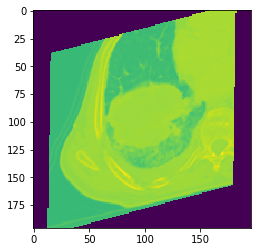

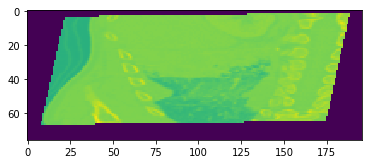

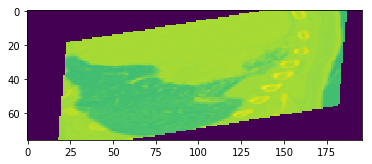

[37.5 97.5 97.5]
[-33.58584076 -41.33156981 -37.97882403]


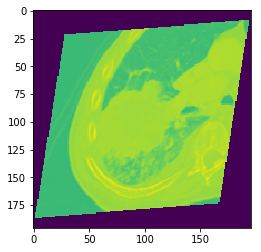

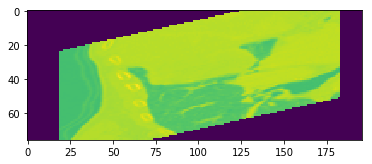

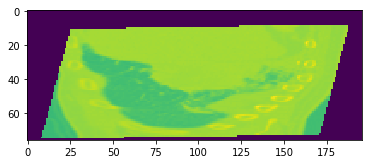

False


In [75]:
# function to rotate (all axes), scale, and shear.

def his(arr, z_rotation_angle, y_rotation_angle, x_rotation_angle, 
        z_shear_angle, y_shear_angle, x_shear_angle,
        z_scale, y_scale, x_scale):

    transformation_matrix  = get_rotation_matrix(z_rotation_angle, y_rotation_angle, x_rotation_angle)

    transformation_matrix = np.dot(transformation_matrix, 
                                   get_shear_matrix(z_shear_angle, y_shear_angle, x_shear_angle))

    transformation_matrix = np.dot(transformation_matrix, 
                                   get_scale_matrix(z_scale, y_scale, x_scale))

    
    # apply affine transofrmation
    return affine_transform(arr, transformation_matrix, order=3, scale=1, image_center=None,
                         recenter=False, missing=-5000, use_scipy=True)


start = time()
his_arr = his(arr, **get_affine_transformation_params())
print (time() - start)

plt.imshow(his_arr[38])
plt.show()
plt.imshow(his_arr[:,120,:])
plt.show()
plt.imshow(his_arr[:,:,80])
plt.show()
    
#########################################################


imageimage
########################################################

print (np.array_equal(his_arr, trans))

# random elastic deformation


In [113]:
# image = sitk.GetArrayFromImage(sitk.ReadImage("/mnt/aertslab/USERS/Ahmed/0_FINAL_SEGMENTAION_DATA/maastro/9_image_interpolated_roi_gt/maastro_44744_image_interpolated_roi_raw_gt.nrrd"))
# label = sitk.GetArrayFromImage(sitk.ReadImage("/mnt/aertslab/USERS/Ahmed/0_FINAL_SEGMENTAION_DATA/maastro/10_label_interpolated_roi_gt/maastro_44744_label_interpolated_roi_raw_gt.nrrd"))

image = sitk.GetArrayFromImage(sitk.ReadImage("/mnt/aertslab/USERS/Ahmed/0_FINAL_SEGMENTAION_DATA/harvard-rt/9_image_interpolated_roi_gt/harvard-rt_178-TC080_image_interpolated_roi_raw_gt.nrrd"))
label = sitk.GetArrayFromImage(sitk.ReadImage("/mnt/aertslab/USERS/Ahmed/0_FINAL_SEGMENTAION_DATA/harvard-rt/10_label_interpolated_roi_gt/harvard-rt_178-TC080_label_interpolated_roi_raw_gt.nrrd"))


# image = sitk.GetArrayFromImage(sitk.ReadImage("/mnt/aertslab/USERS/Ahmed/0_FINAL_SEGMENTAION_DATA/harvard-rt/7_image_interpolated_resized_rescaled/harvard-rt_37-TC095_image_interpolated_resized_rescaled_xx.nrrd"))
# label = sitk.GetArrayFromImage(sitk.ReadImage("/mnt/aertslab/USERS/Ahmed/0_FINAL_SEGMENTAION_DATA/harvard-rt/8_label_interpolated_resized_rescaled/harvard-rt_37-TC095_label_interpolated_resized_rescaled_xx.nrrd"))




-1000 1504 (76, 196, 196)
0 1 (76, 196, 196)
[0 1]
2541
18.999473488973194
(8, 8, 4)
5.235461950302124
-1024.0 1481.2480005698244 (76, 196, 196) float64
0 1 (76, 196, 196) int16
[0 1]


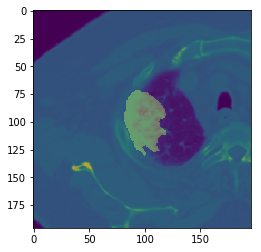

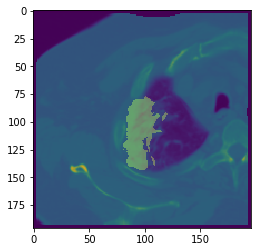

In [119]:



elastic_num_ctrl_pts = 4 # applied to shortest side (i.e. sitk_obj.GetSize()[-1])
elastic_lower = 10
elastic_upper = 20

def get_mesh_shape(sitk_obj, elastic_num_ctrl_pts):
    """
    sitk_obj: sitk obj
    """
    size = sitk_obj.GetSize()
    return ((size[0]//size[2])*elastic_num_ctrl_pts, 
            (size[1]//size[2])*elastic_num_ctrl_pts, 
            elastic_num_ctrl_pts)

def get_bspline_transform(sitk_obj, mesh_shape):
    """
    sitk_obj: sitk obj
    mesh_shape: tuple len 3
    """
    bspline_transform = sitk.BSplineTransformInitializer(sitk_obj, mesh_shape)
    default_params = bspline_transform.GetParameters()
    # set params
    bspline_params = np.random.rand(len(default_params))  
    print (len(default_params))
    bspline_params -= 0.5  # to offset the deformation
    elastic_std = np.random.uniform(elastic_lower, elastic_upper) 
    print (elastic_std)
    bspline_params *= elastic_std
    # apply params
    bspline_transform.SetParameters(bspline_params) 
    return bspline_transform
    
def resample(sitk_obj, bspline_transform, interpolation, fill, return_type):
    # transform
    resampler = sitk.ResampleImageFilter()
    resampler.SetReferenceImage(sitk_obj)
    resampler.SetTransform(bspline_transform)
    resampler.SetInterpolator(interpolation)
    resampler.SetDefaultPixelValue(fill)
    resampler.SetOutputPixelType(return_type)
    resampled = resampler.Execute(sitk_obj)
 
    # get arr
    return sitk.GetArrayFromImage(resampled)

def cleanup(arr):
    """
    This elastic deformation function will mess up the first and final few layers in all 3 axes. 
    It will create swiss cheese holes in these layers.
    To fix this, we replace them with 0's in the image. 
    Label is unlikley to be affected, since the tumor is centered and away from the
    ends in all 3 axes.
    """
    n_slices = 3
    fill = -1024 ################# 0
    arr[:n_slices, :, :] = fill
    arr[-n_slices:, :, :] = fill
    arr[:, :n_slices, :] = fill
    arr[:, -n_slices:, :] = fill
    arr[:, :, :n_slices] = fill
    arr[:, :, -n_slices:] = fill
    return arr

def elastic_deform_arr(image, label):
    """
    Currently, casts numpy array to sitk then back again. 
    This is better done at loading time?

    """
    # convert numpy to sitk
    image_sitk = sitk.GetImageFromArray(image)
    label_sitk = sitk.GetImageFromArray(label)
    # get mesh shape - done once
    mesh_shape = get_mesh_shape(image_sitk, elastic_num_ctrl_pts)
    # get bspline transform (done once on image, same numbers for label)
    bspline_transform = get_bspline_transform(image_sitk, mesh_shape) 
    # resample
    image = resample(image_sitk, bspline_transform, sitk.sitkLinear, -1024, sitk.sitkFloat64) # 0
    label = resample(label_sitk, bspline_transform, sitk.sitkNearestNeighbor, 0, sitk.sitkInt16)
    print (mesh_shape)

    writer = sitk.ImageFileWriter()
    writer.SetFileName("image.nrrd")
    writer.SetUseCompression(True)
    writer.Execute(sitk.GetImageFromArray(cleanup(image)))
    
    writer = sitk.ImageFileWriter()
    writer.SetFileName("label.nrrd")
    writer.SetUseCompression(True)
    writer.Execute(sitk.GetImageFromArray(label))
    
    return cleanup(image), label



##############################################################################


print (image.min(), image.max(), image.shape)
print (label.min(), label.max(), label.shape)
print (np.unique(label))

start = time()
image_e, label_e = elastic_deform_arr(image, label)
print(time()-start)

print (image_e.min(), image_e.max(), image_e.shape, image_e.dtype)
print (label_e.min(), label_e.max(), label_e.shape, label_e.dtype)
print (np.unique(label_e))

i=50
plt.imshow(image[i])
plt.imshow(label[i], alpha=0.3)
plt.show()

plt.imshow(image_e[i])
plt.imshow(label_e[i], alpha=0.3)
plt.show()
#
# i=38
# plt.imshow(arr_elastic[i], vmin=-5000, vmax=3000)
# # plt.imshow(label[i], alpha=0.3)
# plt.show()

# -0.024462580196173925 0.6258462702396387 float64
# 0 1 int16

In [131]:
test_img = np.load("/output/test1/image-40.npy")
test_label = np.load("/output/test1/label-40.npy")

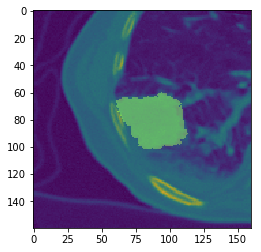

In [127]:
i=46
plt.imshow(test_img[i,:,:])
plt.imshow(test_label[i,:,:], alpha=0.3)
plt.show()

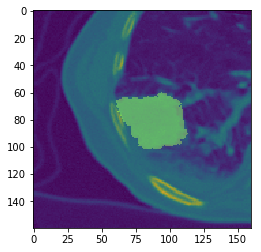

In [130]:
i=46
plt.imshow(test_img[i,:,:])
plt.imshow(test_label[i,:,:], alpha=0.3)
plt.show()

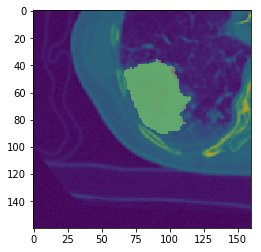

In [135]:
i=36
plt.imshow(test_img[i,:,:])
plt.imshow(test_label[i,:,:], alpha=0.3)
plt.show()

In [153]:
arr = sitk.GetArrayFromImage( sitk.ReadImage("/output/test1/sikooo-31.nrrd") )
print ( np.unique(arr) )
print( len(arr[arr==-1]) )
print( len(arr[arr==2]) )

[-1  0  1]
1
0


In [183]:
elastic = True
if elastic and np.random.uniform() < 0.5:
    print ("hi")

hi


328692

In [ ]:
#### from terminal

0 1 (64, 160, 160) int16
-0.03105383709884451 0.6089579645583832 (64, 160, 160) float64
0 1 (64, 160, 160) int16
-0.03105383709884451 0.6639059346077443 (64, 160, 160) float64
0 1 (64, 160, 160) int16
-0.03348925329807326 0.967763587937621 (64, 160, 160) float64
0 1 (64, 160, 160) int16
-0.04737165984684885 0.8232223997288804 (64, 160, 160) float64
0 1 (64, 160, 160) int16
-0.04162950602258828 1.0617667397578796 (64, 160, 160) float64
0 1 (64, 160, 160) int16
-0.06152421672744302 0.6475333733117634 (64, 160, 160) float64
0 1 (64, 160, 160) int16
-0.03622566864145309 1.0371956111145795 (64, 160, 160) float64
0 1 (64, 160, 160) int16
-0.027445488440765463 1.1010672440194087 (64, 160, 160) float64
0 1 (64, 160, 160) int16
-0.027445488440765463 0.6201112151081604 (64, 160, 160) float64
0 1 (64, 160, 160) int16
-0.09336511222735075 0.9588476539525987 (64, 160, 160) float64
0 1 (64, 160, 160) int16
-0.04786217654619576 1.0064540884031703 (64, 160, 160) float64
-0.02581118816255507 0.9725977869391627 (64, 160, 160) float64
0 1 (64, 160, 160) int16


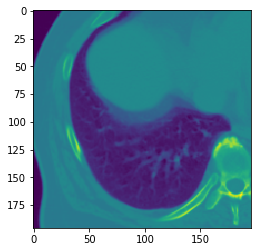

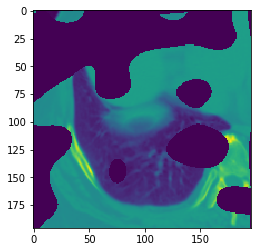

In [96]:
i=0
plt.imshow(image[i,:,:])
# plt.imshow(label[:,:,i], alpha=0.3)
plt.show()

plt.imshow(image_e[i,:,:])
# plt.imshow(label_e[:,:,i], alpha=0.3)
plt.show()

In [80]:
image.shape

(76, 196, 196)

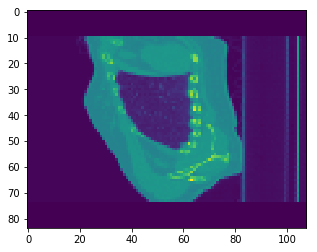

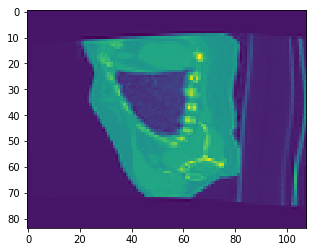

In [13]:
i=90
plt.imshow(image[:,:,i])
# plt.imshow(label[:,:,i], alpha=0.3)
plt.show()

plt.imshow(image_e[:,:,i])
# plt.imshow(label_e[:,:,i], alpha=0.3)
plt.show()

In [55]:
np.random.uniform() < 0.5

True

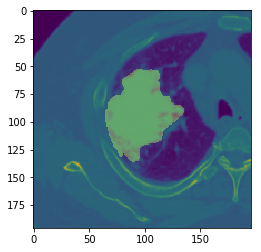

In [306]:
i=39
plt.imshow(image[i])
plt.imshow(label[i], alpha=0.3)
plt.show()

In [280]:
2541 - 9*256

237

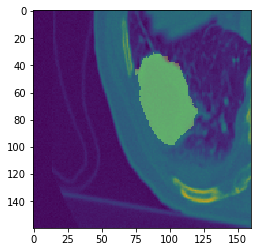

In [173]:
plt.imshow( np.load("/output/test/image-35.npy")[38] )
plt.imshow(np.load("/output/test/label-35.npy")[38], alpha=0.3)

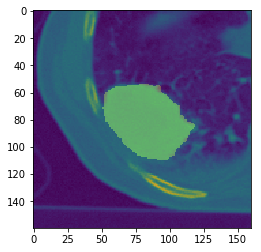

In [174]:
plt.imshow( np.load("/output/test/image-71.npy")[38] )
plt.imshow(np.load("/output/test/label-71.npy")[38], alpha=0.3)

In [180]:
np.unique( np.load("/output/test/label-71.npy") )

array([0, 1], dtype=int16)

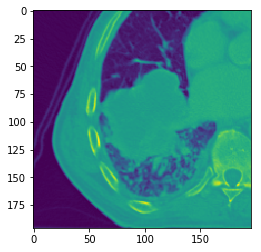

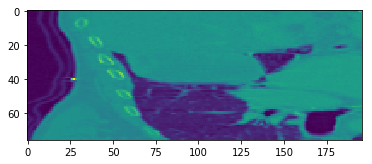

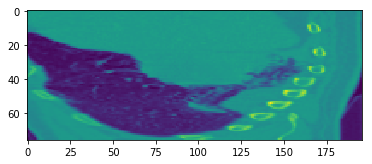

In [103]:
plt.imshow(arr[38])
plt.show()
plt.imshow(arr[:,80,:])
plt.show()
plt.imshow(arr[:,:,80])
plt.show()

In [133]:
transformation_matrix /1

array([[ 1.02272938,  0.06544338, -0.08378718],
       [-0.35116259,  0.92936609, -0.21624279],
       [ 0.66098615,  0.8591793 ,  0.99245003]])

In [134]:
transformation_matrix

array([[ 1.02272938,  0.06544338, -0.08378718],
       [-0.35116259,  0.92936609, -0.21624279],
       [ 0.66098615,  0.8591793 ,  0.99245003]])

In [3]:
arr1 = sitk.GetArrayFromImage(sitk.ReadImage("/mnt/aertslab/USERS/Ahmed/0_FINAL_SEGMENTAION_DATA/maastro/3_image_interpolated/maastro_43062_image_interpolated_raw_raw_xx.nrrd"))

In [4]:
arr1.shape

(111, 500, 500)

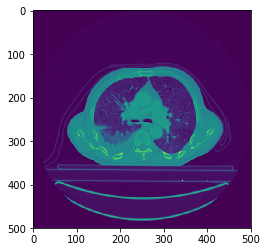

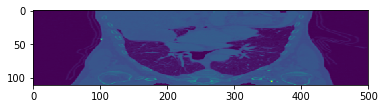

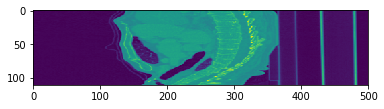

In [5]:
plt.imshow(arr1[60])
plt.show()
plt.imshow(arr1[:,250,:])
plt.show()
plt.imshow(arr1[:,:,250])
plt.show()

# add metrics to topcoder

In [26]:
path = "/mnt/aertslab/USERS/Ahmed/0_FINAL_SEGMENTAION_DATA/harvard-rt/0_competition_scores/tune_tc_scores.csv"
df = pd.read_csv(path, index_col=0)
df.head()

precision_list = []
recall_list = []
jaccard_list = []
dice_list = []
#
for index, row in df.iterrows():
    precision_list.append( precision(row["tp"], row["fp"]) )
    recall_list.append( recall(row["tp"], row["fn"]) )
    jaccard_list.append( jaccard(row["tp"], row["fp"], row["fn"]))
    dice_list.append( dice(row["tp"], row["fp"], row["fn"]) )
    
df["precision"] = precision_list
df["recall"] = recall_list
df["jaccard"] = jaccard_list
df["dice"] = dice_list

df.to_csv("tune_tc_scores.csv")

In [35]:
A = [1,2,30,0,0,0,0,0]
np.median(A)

0.0

# GTV MAX SIZE

In [90]:
def get_bbox(mask_data):
    # crop maskData to only the 1's
    # http://stackoverflow.com/questions/31400769/bounding-box-of-numpy-array
    # maskData order is z,y,x because we already rolled it
    Z = np.any(mask_data, axis=(1, 2))
    Y = np.any(mask_data, axis=(0, 2))
    X = np.any(mask_data, axis=(0, 1))
    #
    X_min, X_max = np.where(X)[0][[0, -1]]
    Y_min, Y_max = np.where(Y)[0][[0, -1]]
    Z_min, Z_max = np.where(Z)[0][[0, -1]]
    # 1 is added to account for the final slice also including the mask
    return Z_max-Z_min+1, Y_max-Y_min+1, X_max-X_min+1

In [107]:
path = "/mnt/aertslab/DATA/Lung/RTOG_0617/0_processed/6_gtv_interpolated"
x_list = []
y_list = []
z_list = []
for nrrd in os.listdir(path):
    print (nrrd)
    array = sitk.GetArrayFromImage( sitk.ReadImage(os.path.join(path, nrrd)) )
    z, y, x = get_bbox(array)
    x_list.append(x)
    y_list.append(y)
    z_list.append(z)

rtog_0617-711646_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-469897_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-309598_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-578008_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-565803_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-503047_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-761486_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-590991_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-689094_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-745359_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-805653_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-682647_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-710650_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-592873_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-457079_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-668955_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-533399_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-474399_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-454983_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-803855_gtv_interpolated_raw_raw_xx.nrrd


rtog_0617-620128_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-839996_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-763022_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-806431_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-434035_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-507613_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-621281_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-475757_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-701175_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-688122_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-536546_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-563061_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-581703_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-640630_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-381906_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-626381_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-582528_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-583972_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-441230_gtv_interpolated_raw_raw_xx.nrrd
rtog_0617-538439_gtv_interpolated_raw_raw_xx.nrrd


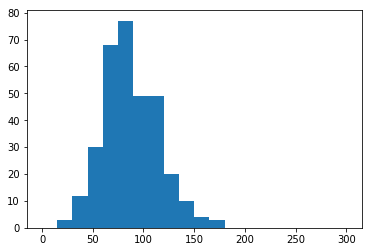

In [108]:
plt.hist(x_list, bins=20, range=(0,300))
plt.show()

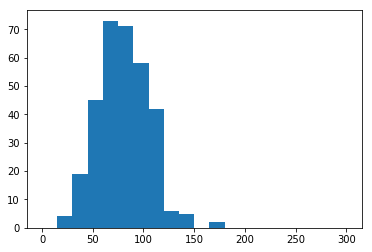

In [109]:
plt.hist(y_list, bins=20, range=(0,300))
plt.show()

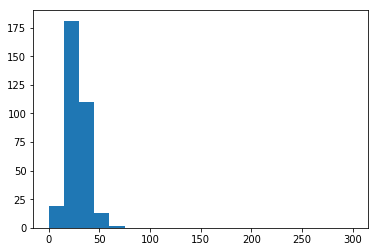

In [110]:
plt.hist(z_list, bins=20, range=(0,300))
plt.show()

In [98]:
path = "/mnt/aertslab/USERS/Ahmed/0_FINAL_SEGMENTAION_DATA/harvard-rt/4_label_interpolated"
x_list = []
y_list = []
z_list = []
for nrrd in os.listdir(path):
    print (nrrd)
    array = sitk.GetArrayFromImage( sitk.ReadImage(os.path.join(path, nrrd)) )
    z, y, x = get_bbox(array)
    x_list.append(x)
    y_list.append(y)
    z_list.append(z)

harvard-rt_1621-TC407_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1226-TC492_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1313-TC487_label_interpolated_raw_raw_xx.nrrd
harvard-rt_207-TC102_label_interpolated_raw_raw_xx.nrrd
harvard-rt_906-TC315_label_interpolated_raw_raw_xx.nrrd
harvard-rt_194-TC088_label_interpolated_raw_raw_xx.nrrd
harvard-rt_904-TC314_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1311-TC486_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1161-TC470_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1182-TC469_label_interpolated_raw_raw_xx.nrrd
harvard-rt_142-TC044_label_interpolated_raw_raw_xx.nrrd
harvard-rt_912-TC322_label_interpolated_raw_raw_xx.nrrd
harvard-rt_923-TC344_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1071-TC402_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1312-TC488_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1222-TC559_label_interpolated_raw_raw_xx.nrrd
harvard-rt_943-TC389_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1181-TC529_label_interpolate

harvard-rt_409-TC196_label_interpolated_raw_raw_xx.nrrd
harvard-rt_161-TC063_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1069-TC401_label_interpolated_raw_raw_xx.nrrd
harvard-rt_905-TC342_label_interpolated_raw_raw_xx.nrrd
harvard-rt_426-TC158_label_interpolated_raw_raw_xx.nrrd
harvard-rt_911-TC319_label_interpolated_raw_raw_xx.nrrd
harvard-rt_908-TC320_label_interpolated_raw_raw_xx.nrrd
harvard-rt_269-TC151_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1700-TC381_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1110-TC475_label_interpolated_raw_raw_xx.nrrd
harvard-rt_361-TC139_label_interpolated_raw_raw_xx.nrrd
harvard-rt_40-TC112_label_interpolated_raw_raw_xx.nrrd
harvard-rt_951-TC443_label_interpolated_raw_raw_xx.nrrd
harvard-rt_984-TC232_label_interpolated_raw_raw_xx.nrrd
harvard-rt_252-TC184_label_interpolated_raw_raw_xx.nrrd
harvard-rt_513-TC200_label_interpolated_raw_raw_xx.nrrd
harvard-rt_52-TC166_label_interpolated_raw_raw_xx.nrrd
harvard-rt_250-TC185_label_interpolated_raw_raw

harvard-rt_1189-TC540_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1214-TC535_label_interpolated_raw_raw_xx.nrrd
harvard-rt_862-TC224_label_interpolated_raw_raw_xx.nrrd
harvard-rt_665-TC111_label_interpolated_raw_raw_xx.nrrd
harvard-rt_898-TC299_label_interpolated_raw_raw_xx.nrrd
harvard-rt_928-TC355_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1730-TC568_label_interpolated_raw_raw_xx.nrrd
harvard-rt_36-TC009_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1172-TC503_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1725-TC526_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1190-TC523_label_interpolated_raw_raw_xx.nrrd
harvard-rt_108-TC020_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1347-TC411_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1627-TC516_label_interpolated_raw_raw_xx.nrrd
harvard-rt_38-TC053_label_interpolated_raw_raw_xx.nrrd
harvard-rt_945-TC396_label_interpolated_raw_raw_xx.nrrd
harvard-rt_41-TC174_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1211-TC554_label_interpolated_ra

harvard-rt_1141-TC458_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1495-TC467_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1054-TC416_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1215-TC579_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1177-TC521_label_interpolated_raw_raw_xx.nrrd
harvard-rt_703-TC130_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1111-TC450_label_interpolated_raw_raw_xx.nrrd
harvard-rt_940-TC373_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1536-TC472_label_interpolated_raw_raw_xx.nrrd
harvard-rt_950-TC410_label_interpolated_raw_raw_xx.nrrd
harvard-rt_127-TC030_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1395-TC437_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1058-TC421_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1728-TC531_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1064-TC398_label_interpolated_raw_raw_xx.nrrd
harvard-rt_932-TC357_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1736-TC572_label_interpolated_raw_raw_xx.nrrd
harvard-rt_1680-TC585_label_interpol

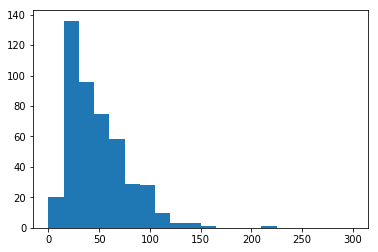

In [104]:
plt.hist(x_list, bins=20, range=(0,300))
plt.show()

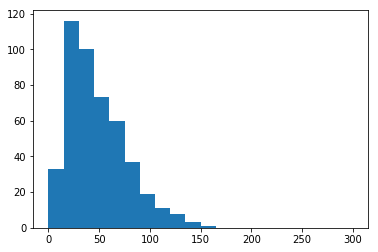

In [105]:
plt.hist(y_list, bins=20, range=(0,300))
plt.show()

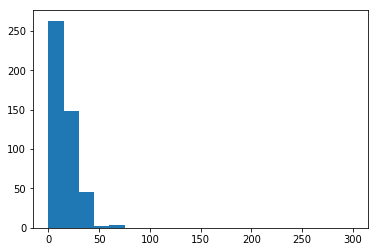

In [106]:
plt.hist(z_list, bins=20, range=(0,300))
plt.show()

In [2]:
nrrd = sitk.ReadImage("/output/65_recall-loss-0.001/maastro_63619_prediction.nrrd")

In [3]:
nrrd.GetSpacing()

(3.0, 3.0, 6.0)

# SAVE CANDIDATE ROI

In [90]:
from calculate_bbox_metrics import calculate_bbox_metrics 
from utils import save_candidate_roi

In [101]:


##########################

gt = sitk.GetArrayFromImage(sitk.ReadImage("/mnt/aertslab/USERS/Ahmed/0_FINAL_SEGMENTAION_DATA/maastro/8_label_interpolated_resized_rescaled/maastro_63728_label_interpolated_resized_rescaled_xx.nrrd"))
pr = sitk.GetArrayFromImage(sitk.ReadImage("/output/89_wce-dice-loss-0.001/maastro_63728_prediction.nrrd"))
# print (gt.shape, pr.shape)


spacing = (6,3,3)  # z,y,x
bbox_metrics = calculate_bbox_metrics(gt, pr, spacing)


MASTER_FOLDER = "/mnt/aertslab/USERS/Ahmed/0_FINAL_SEGMENTAION_DATA"
IMAGE_INTERPOLATED_RESIZED_FOLDER = "5_image_interpolated_resized"
LABEL_INTERPOLATED_RESIZED_FOLDER = "6_label_interpolated_resized"
IMAGE_INTERPOLATED_ROI_FOLDER = "9_image_interpolated_roi"
LABEL_INTERPOLATED_ROI_FOLDER = "10_label_interpolated_roi"

patient_id = 63728
dataset = "maastro"

def path_helper(folder, file_tail):
    return "{}/{}/{}/{}_{}_{}.nrrd".format(MASTER_FOLDER, dataset, folder, dataset, patient_id, file_tail)

crop_size = (68, 172, 172) # z,y,x
# model size (64, 160, 160)

save_candidate_roi(bbox_metrics, 
                   spacing, 
                   path_helper(IMAGE_INTERPOLATED_RESIZED_FOLDER, "image_interpolated_resized_raw_xx"), 
                   path_helper(LABEL_INTERPOLATED_RESIZED_FOLDER, "label_interpolated_resized_raw_xx"), 
                   crop_size, 
                   path_helper(IMAGE_INTERPOLATED_ROI_FOLDER, "image_interpolated_roi_raw_xx"),
                   path_helper(LABEL_INTERPOLATED_ROI_FOLDER, "label_interpolated_roi_raw_xx"))


In [77]:
/mnt/aertslab/USERS/Ahmed/0_FINAL_SEGMENTAION_DATA/maastro/9_image_interpolated_roi

191

In [40]:
a,b = 3,4

In [2]:
x = 4
def func():
    print (x)
func()


4


# metrics

In [38]:
img = sitk.GetArrayFromImage(sitk.ReadImage("/mnt/aertslab/USERS/Ahmed/0_FINAL_SEGMENTAION_DATA/maastro/7_image_interpolated_resized_rescaled/maastro_64155_image_interpolated_resized_rescaled_xx.nrrd"))
gt = sitk.GetArrayFromImage(sitk.ReadImage("/mnt/aertslab/USERS/Ahmed/0_FINAL_SEGMENTAION_DATA/maastro/8_label_interpolated_resized_rescaled/maastro_64155_label_interpolated_resized_rescaled_xx.nrrd"))
pr = sitk.GetArrayFromImage(sitk.ReadImage("/output/57_gtv-maastro-dice-crop-rotate-blur/maastro_64155_prediction.nrrd"))

In [39]:
img.shape, gt.shape, pr.shape

((84, 108, 108), (84, 108, 108), (84, 108, 108))

In [40]:
metrics.dice(gt, pr)

0.881859264041317

In [41]:
metrics.compute_dice_coefficient(gt, pr)

0.881859264041317

In [45]:
metrics.segmentation_score(gt, pr, (6,3,3))

0.796050625743848

In [46]:
metrics.segmentation_score_2(gt, pr, (6,3,3))

0.7960506257438481

In [48]:
siko = [4,5,6,12]
np.mean(siko), np.median(siko)

(6.75, 5.5)

In [51]:
siko = [4,5,6,12,np.NaN,np.NaN,np.NaN,np.NaN]
np.mean(siko), np.median(siko)

(nan, nan)

In [193]:
def threshold(pred, thresh=0.5):
    pred[pred<thresh] = 0
    pred[pred>=thresh] = 1
    return pred

In [211]:
import tkinter   
tkinter._test()

ImportError: No module named '_tkinter', please install the python3-tk package

In [207]:
pred_link = "/output/53_gtv-tversky-focal-inverse/0617-748036_prediction.nrrd"
obj = sitk.ReadImage(pred_link)
print(obj.GetSize())
pr = threshold(sitk.GetArrayFromImage(sitk.ReadImage(pred_link)))
print(pr.shape)
gt_link = "/output/53_gtv-tversky-focal-inverse/rtog_0617-748036_gtv_interpolated_resized_rescaled_xx.nrrd"
gt = sitk.GetArrayFromImage(sitk.ReadImage(gt_link))
print(gt.shape)

(108, 100, 80)
(80, 100, 108)
(80, 100, 108)


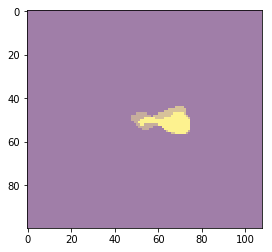

In [195]:
sl = 42
plt.imshow(pr[sl, :, :], alpha=0.3)
plt.imshow(gt[sl, :, :], alpha=0.3)
plt.show()

In [202]:
print(metrics.precision(gt, pr), metrics.recall(gt, pr), metrics.jaccard(gt, pr), 
metrics.dice(gt, pr), metrics.bbox_distance(gt, pr, (6,3,3)))

0.4653024911032028 0.5173095944609297 0.32444168734491313 0.4899297423887588 {'z_distance': 4.5, 'distance': 13.162446581088183, 'y_distance': 3.0, 'ground_truth_bbox_metrics': {'Z': {'center': 43.0, 'length': 9, 'max': 47, 'min': 39}, 'Y': {'center': 49.0, 'length': 15, 'max': 56, 'min': 42}, 'X': {'center': 62.5, 'length': 24, 'max': 74, 'min': 51}}, 'x_distance': 12.0, 'prediction_bbox_metrics': {'Z': {'center': 44.5, 'length': 12, 'max': 50, 'min': 39}, 'Y': {'center': 48.0, 'length': 17, 'max': 56, 'min': 40}, 'X': {'center': 60.5, 'length': 28, 'max': 74, 'min': 47}}}


In [205]:
metrics.segmentation_score(gt, pr, (6, 3, 3)), metrics.segmentation_score_2(gt, pr, (6, 3, 3))

83394.48183556405
83394.48183556405


(0.8482057441758719, 0.25591567740859034)

In [182]:
metrics.bbox_distance(gt, pr, (6,3,3))["prediction_bbox_metrics"]

{'X': {'center': 60.5, 'length': 28, 'max': 74, 'min': 47},
 'Y': {'center': 48.0, 'length': 17, 'max': 56, 'min': 40},
 'Z': {'center': 44.5, 'length': 12, 'max': 50, 'min': 39}}

In [145]:
gt = np.array([[0,0,0,0,0,0,0,0],
               [0,0,0,0,0,0,0,0],
               [0,0,0,0,0,0,0,0],
               [0,0,0,0,0,0,0,0],
               [0,0,0,1,1,1,0,0],
               [0,0,1,1,1,1,0,0],
               [0,0,0,1,1,1,0,0]])

pr = np.array([[0,0,0,0,0,0,0,0],
               [0,0,1,1,1,0,0,0],
               [0,0,1,1,1,0,0,0],
               [0,0,1,1,1,0,0,0],
               [0,0,1,1,1,0,0,0],
               [0,0,0,0,0,0,0,0],
               [0,0,0,0,0,0,0,0]]) 

em = np.array([[0,0,0,0,0,0,0,0],
               [0,0,0,0,0,0,0,0],
               [0,0,0,0,0,0,0,0],
               [0,0,0,0,0,0,0,0],
               [0,0,0,0,0,0,0,0],
               [0,0,0,0,0,0,0,0],
               [0,0,0,0,0,0,0,0]]) 

gt3 = np.array([gt,gt,gt,em])
pr3 = np.array([em,pr,pr,pr])

print(gt3.shape, pr3.shape)

(4, 7, 8) (4, 7, 8)


0.5459337127186302

In [169]:
metrics.segmentation_score2(gt, pr, (1,1,1))

0.39761081344778815

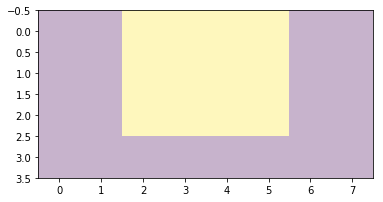

In [113]:
sl = 1
plt.imshow(gt3[:, 5, :], alpha=0.3)

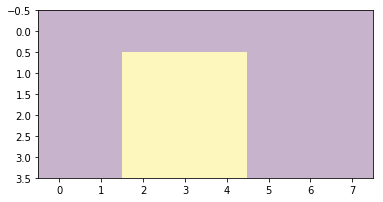

In [115]:
plt.imshow(pr3[:, 4, :], alpha=0.3)

In [111]:
metrics.bbox_distance(gt3, pr3, (1,1,1))

{'distance': 2.7386127875258306,
 'ground_truth_bbox_metrics': {'X': {'center': 3.5,
   'length': 4,
   'max': 5,
   'min': 2},
  'Y': {'center': 5.0, 'length': 3, 'max': 6, 'min': 4},
  'Z': {'center': 1.0, 'length': 3, 'max': 2, 'min': 0}},
 'prediction_bbox_metrics': {'X': {'center': 3.0,
   'length': 3,
   'max': 4,
   'min': 2},
  'Y': {'center': 2.5, 'length': 4, 'max': 4, 'min': 1},
  'Z': {'center': 2.0, 'length': 3, 'max': 3, 'min': 1}},
 'x_distance': 0.5,
 'y_distance': 2.5,
 'z_distance': 1.0}

In [75]:
gt3.shape

(8, 8, 3)

In [78]:
gt3[:,:,1]

array([[0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 1, 1, 0, 0],
       [0, 0, 0, 1, 1, 1, 0, 0],
       [0, 0, 0, 1, 1, 1, 0, 0],
       [0, 0, 0, 1, 1, 1, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0]])

In [ ]:


for patient in test_data:
    # get
    patid = patient["patid"]
    image_arr = patient["image_arr"]
    gt_arr = patient["label_arr"]
    pred_link = "/output/{}/{}_prediction.nrrd".format(folder, patient["patid"])
    pred_arr = sitk.GetArrayFromImage(sitk.ReadImage(pred_link))
    # volume
    gt_volume = len(gt_arr[gt_arr==1])
    volume_list.append(gt_volume)
    # distance
    bbox_metrics = calculate_bbox_metrics(gt_arr, pred_link)
    distance_list.append(bbox_metrics["distance"])
    # dice
    dice = dice_df[dice_df["patids"]==patid].reset_index(drop=True)["dice"][0]

In [13]:
gt = np.array([[0,0,0,0,0,0,0,0],
               [0,0,0,0,0,0,0,0],
               [0,0,1,1,1,1,0,0],
               [0,0,1,1,1,1,0,0],
               [0,0,1,1,1,1,0,0],
               [0,0,1,1,1,1,0,0],
               [0,0,1,1,1,0,0,0],
               [0,0,1,1,1,1,1,0]])

pr = np.array([[0,0,0,0,0,1,1,1],
               [0,0,1,1,1,0,0,0],
               [0,0,1,1,1,0,0,0],
               [0,0,1,1,1,0,0,0],
               [0,0,1,1,1,0,0,0],
               [0,0,0,0,0,0,0,0],
               [0,0,0,0,0,0,0,0],
               [0,0,0,0,0,0,0,0]]) 
# overlap = 6
# fp  = 3
# fn = 12

In [14]:
TP = np.logical_and(gt, pr).sum()
FP = pr[(pr==1) & (gt==0)].sum()
FN = gt[(gt==1) & (pr==0)].sum()
print(TP, FP, FN)

10 6 14


In [15]:
metrics.precision(gt, pr), metrics.dice(gt, pr), metrics.recall(gt, pr), metrics.jaccard(gt, pr)

(0.625, 0.5, 0.4166666666666667, 0.3333333333333333)

In [183]:
siko = [
{
    "a":5,
    "b":6
},
{
    "a":7,
    "b":8
}
]

In [184]:
df = pd.DataFrame.from_dict(siko)
df.head()

,a,b
0,5,6
1,7,8


In [17]:
from scipy.spatial.distance import directed_hausdorff

In [18]:
directed_hausdorff(gt, pr)

(1.4142135623730951, 7, 1)

In [20]:
gt0 = np.zeros((3,3,3))
gt0[1] = np.ones((3,3))
gt0

array([[[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]]])

In [21]:
directed_hausdorff(gt0, gt0)

ValueError: Buffer has wrong number of dimensions (expected 2, got 3)


# my generator

In [20]:
batch_size = 3
angle_range = 10
final_shape = (80, 96, 96)
blur_multiplier = 2.0
blur_random_range = 0.6 # 60% + or -
augment = True

#
gen = generator.generator(data_train_tune["train"]["images"],
data_train_tune["train"]["labels"],
batch_size, 
angle_range, 
final_shape, 
blur_multiplier, 
blur_random_range, 
augment)

In [21]:
img, lab = next(gen)

1
generator augmentation :: 0
0
generator augmentation :: 1
2
generator augmentation :: 2
3
generator augmentation :: 3
1
generator augmentation :: 4
1
generator augmentation :: 5
1
generator augmentation :: 6
1
generator augmentation :: 7
2
generator augmentation :: 8
[6 4 2 1 5 7 8 0 3]


In [22]:
img.shape

(3, 1, 80, 96, 96)

In [23]:
lab.shape

(3, 1, 80, 96, 96)

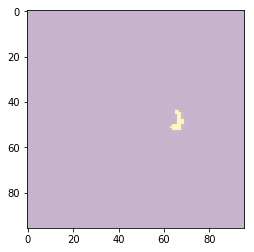

In [26]:
p = 1
i=48
# plt.imshow(img[p, 0, i, :, :])
plt.imshow(lab[p, 0, i, :, :], alpha = 0.3)
plt.show()

In [27]:
lab[p, 0, i, :, :][50]

array([0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e

(array([145., 101.,  35.,  23.,  12.,   4.,   3.,   1.,   0.,   1.]),
 array([   93. ,  1603.4,  3113.8,  4624.2,  6134.6,  7645. ,  9155.4,
        10665.8, 12176.2, 13686.6, 15197. ]),
 <a list of 10 Patch objects>)

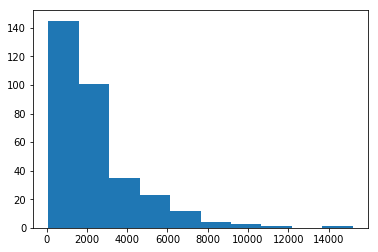

In [31]:
plt.hist(volume_list)

(array([145., 101.,  35.,  23.,  12.,   4.,   3.,   1.,   0.,   1.]),
 array([0.01076389, 0.1855787 , 0.36039352, 0.53520833, 0.71002315,
        0.88483796, 1.05965278, 1.23446759, 1.40928241, 1.58409722,
        1.75891204]),
 <a list of 10 Patch objects>)

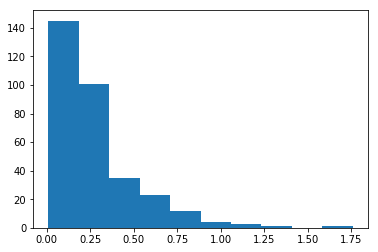

In [32]:
plt.hist(ratio_list)

# TRASH

In [61]:
label[48][45]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
      dtype=uint8)

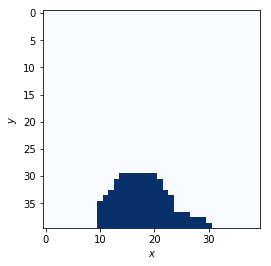

1.0

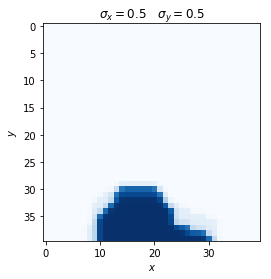

In [133]:
import matplotlib.pyplot as pl
import numpy as np
import scipy as sp
import scipy.ndimage

n = 200 # widht/height of the array
m = 1000 # number of points
sigma_y = 0.5
sigma_x = 0.5

# Create input array
x = np.zeros((n, n)) 
i = np.random.choice(range(0, n * n), size=m)
x[i // n, i % n] = 1.0
x = label.astype(np.float64)

# Plot input array
pl.imshow(x[48][20:60,20:60], cmap='Blues', interpolation='nearest')
pl.xlabel("$x$")
pl.ylabel("$y$")
pl.savefig("array.png")
pl.show()
# Apply gaussian filter
sigma = [sigma_y, sigma_x]


# Display filtered array
pl.imshow(y[48][20:60,20:60], cmap='Blues', interpolation='nearest')
pl.xlabel("$x$")
pl.ylabel("$y$")
pl.title("$\sigma_x = " + str(sigma_x) + "\quad \sigma_y = " + str(sigma_y) + "$")
pl.savefig("smooth_array_" + str(sigma_x) + "_" + str(sigma_y) + ".png")

y.max()

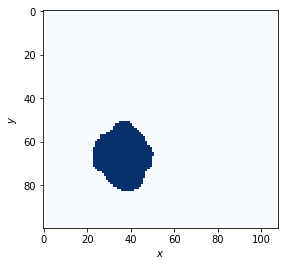

1.0

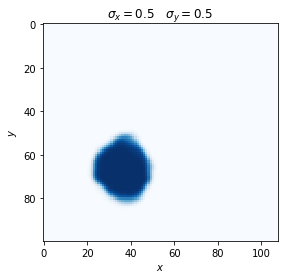

In [142]:
import matplotlib.pyplot as pl
import numpy as np
import scipy as sp
import scipy.ndimage

n = 200 # widht/height of the array
m = 1000 # number of points
sigma_y = 0.5
sigma_x = 0.5

sl = 54

# Create input array
x = np.zeros((n, n)) 
i = np.random.choice(range(0, n * n), size=m)
x[i // n, i % n] = 1.0
x = label.astype(np.float64)

# Plot input array
pl.imshow(x[sl], cmap='Blues', interpolation='nearest')
pl.xlabel("$x$")
pl.ylabel("$y$")
pl.show()
# Apply gaussian filter
sigma = [sigma_y, sigma_x]
y = sp.ndimage.filters.gaussian_filter(x, 1, mode='constant')

# Display filtered array
pl.imshow(y[sl], cmap='Blues', interpolation='nearest')
pl.xlabel("$x$")
pl.ylabel("$y$")
pl.title("$\sigma_x = " + str(sigma_x) + "\quad \sigma_y = " + str(sigma_y) + "$")

y.max()

In [143]:
x[54][70]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0.])

In [144]:
y[54][70]

array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 2.75921977e-06, 9.70199986e-05, 1.39827923e-03,
       1.06400447e-02, 6.22490445e-02, 2.53654547e-01, 5.85497438e-01,
       8.46530608e-01, 9.57773503e-01, 9.88987145e-01, 9.94826450e-01,
       9.96509259e-01, 9.98432155e-01, 9.99636135e-01, 9.99948248e-01,
       9.99994064e-01, 9.99999583e-01, 9.99999986e-01, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 9.99999993e-01,
       9.99989538e-01, 9.99582358e-01, 9.93203805e-01, 9.46160324e-01,
       7.73151185e-01, 4.54412961e-01, 1.60520575e-01, 2.97855674e-02,
       3.49931306e-03, 5.71931796e-04, 9.11913254e-05, 7.41823993e-06,
      

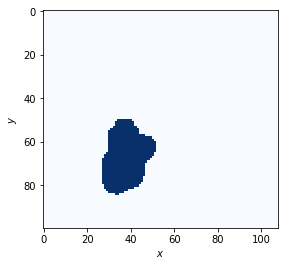

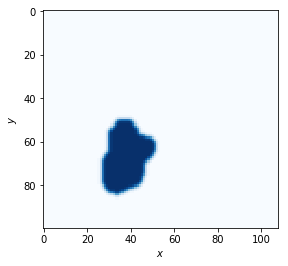

In [113]:
import matplotlib.pyplot as pl
import numpy as np
import scipy as sp
import scipy.ndimage

x = label[48].astype(np.float64)

pl.imshow(x, cmap='Blues', interpolation='nearest')
pl.xlabel("$x$")
pl.ylabel("$y$")
pl.show()
# Arbitrary weights
weights = np.array([[0, 0, 1, 0, 0],
                    [0, 2, 4, 2, 0],
                    [1, 4, 8, 4, 1],
                    [0, 2, 4, 2, 0],
                    [0, 0, 1, 0, 0]],
                   dtype=np.float)
weights = weights / np.sum(weights[:])
y = sp.ndimage.filters.convolve(x, weights, mode='constant')


# Display filtered array
pl.imshow(y, cmap='Blues', interpolation='nearest')
pl.xlabel("$x$")
pl.ylabel("$y$")
pl.savefig("smooth_array.png")

In [114]:
y[48]

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.02777778,
       0.02777778, 0.02777778, 0.02777778, 0.02777778, 0.02777778,
       0.02777778, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

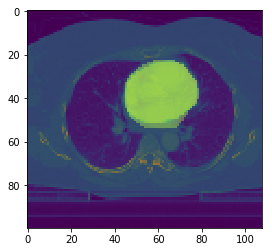

In [73]:
p = 3
i=41
plt.imshow(data_test[p]["image_arr"][i, :, :])
plt.imshow(pred[i, :, :], alpha = 0.3)
plt.imshow(data_test[p]["label_arr"][i, :, :, 1], alpha = 0.3)

plt.show()

In [53]:
data_test[p]["image_arr"][i, :, :].shape

(100, 108)

In [55]:
pred[i, :, :].shape

(100, 108)

In [56]:
data_test[p]["label_arr"][i, :, :, 1].shape

(100, 108)

In [ ]:
import sys
sys.path.append("/path/to/dir")

In [18]:
pred1 = np.load("/output/36_test_prediction_0617-748036.npy")
pred1.shape

(160, 288, 320, 4)

In [19]:
for i in range(4):
    print(pred1[:,:,:,i].max())

0.00018081069
0.0005929768
0.00010225177
1.0


In [12]:
pred1[:,:,:,3].max()

1.0

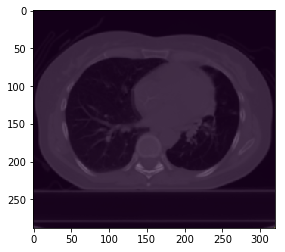

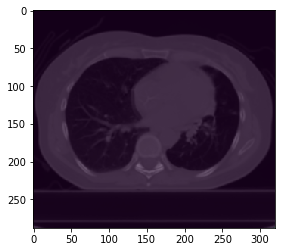

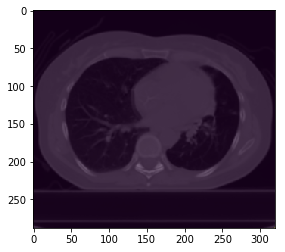

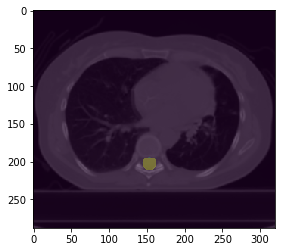

In [20]:
for j in range(4):
    i=70
    data[p]
    plt.imshow(data[1]["image"][i])
    plt.imshow(pred1[i][:,:,j], alpha=0.3)
#     plt.imshow(data[0]["label"][i][:,:,j], alpha=0.3)
    plt.show()

In [84]:
data[0]["image"][70].shape

KeyError: 0

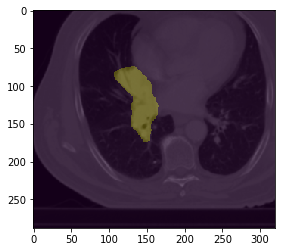

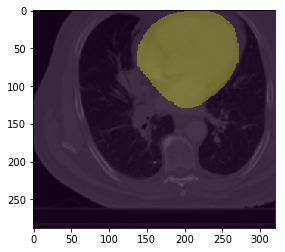

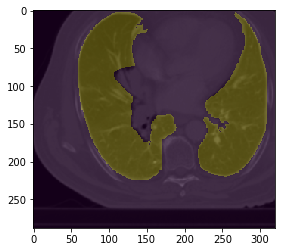

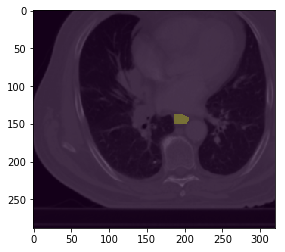

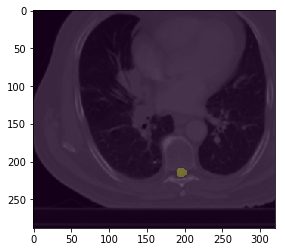

In [76]:
for j in range(5):
    i=70
    plt.imshow(data[0]["image"][i])
    plt.imshow(data[0]["label"][i][:,:,j], alpha=0.3)
    plt.show()

In [64]:
siko = [2,3,4,5,6]
np.random.shuffle(siko)
siko

[4, 6, 2, 5, 3]

In [65]:
np.random.permutation(10)

array([4, 3, 6, 8, 5, 9, 7, 2, 0, 1])

In [66]:
A = [4,5,6,7,8,9,10]

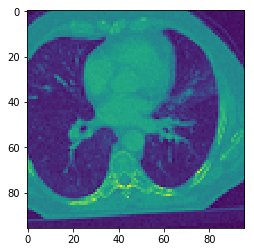

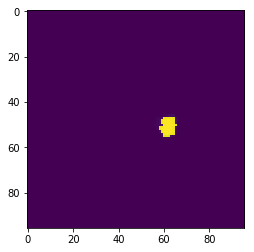

In [75]:

plt.imshow(np.load("/output/90_test/image_34.npy")[35])
plt.show()
plt.imshow(np.load("/output/90_test/label_34.npy")[35])
plt.show()

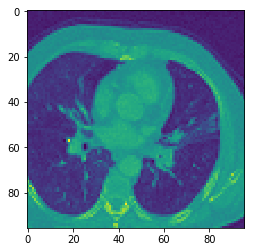

In [72]:
plt.imshow(np.load("/output/90_test/image_2.npy")[40])

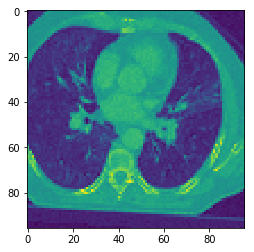

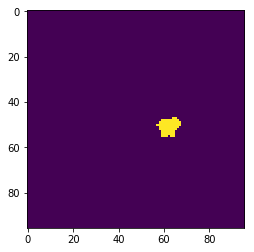

In [79]:
sl = 38
plt.imshow(np.load("/output/90_test/image_8.npy")[sl])
plt.show()
plt.imshow(np.load("/output/90_test/label_8.npy")[sl])
plt.show()

In [81]:
np.load("/output/90_test/label_8.npy")[sl][50]

array([0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 7.7515262e-13,
       9.1835253e-05, 9.9954087e-01, 9.9990815e-01, 9.9990815e

In [ ]:
0_0617-259694_93/160
1_0617-305105_127/160
2_0617-308175_160/160
0_0617-715810_128/160
1_0617-716741_120/160
train image shape :: (380, 288, 320, 3) 
train label shape :: (380, 288, 320, 5)
tune image shape :: (248, 288, 320, 3) 
tune label shape :: (248, 288, 320, 5)

In [413]:
images = np.load("/output/single_model_images.npy")
labels = np.load("/output/single_model_labels.npy")
images.shape, labels.shape

((536, 288, 320, 3), (536, 288, 320, 5))

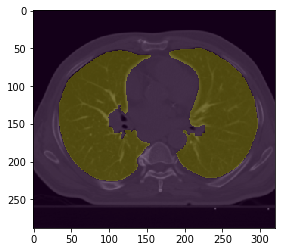

In [435]:
i = 140
plt.imshow(images[i])
plt.imshow(labels[i][:,:,0], alpha=0.3)
plt.show()

In [433]:
labels[80].shape

(288, 320, 5)

In [436]:
labels[80][:,:,0].shape

(288, 320)

In [409]:
arrs_combined = np.stack(arrs, axis=2)
arrs_combined.shape

(288, 320, 2)

In [411]:
arrs_combined[:,:,1]

array([[2., 2., 2., ..., 2., 2., 2.],
       [2., 2., 2., ..., 2., 2., 2.],
       [2., 2., 2., ..., 2., 2., 2.],
       ...,
       [2., 2., 2., ..., 2., 2., 2.],
       [2., 2., 2., ..., 2., 2., 2.],
       [2., 2., 2., ..., 2., 2., 2.]])

In [375]:
import numpy as np
import pandas as pd
import SimpleITK as sitk
from collections import defaultdict


df = pd.read_csv("/data/0_curation/rtog_final_curation_ctv.csv")
crop_3d = [0,160,6,294,2,322] # 160, 288, 320
crop_2d = [6,294,2,322] # 288, 320

paths = {
    "image": "/data/7_image_interpolated_resized/rtog_{}_image_interpolated_resized_raw_xx.nrrd",
    "lung": "/data/10_lung_interpolated_resized/rtog_{}_lung_interpolated_resized_raw_xx.nrrd",
    "heart": "/data/9_heart_interpolated_resized/rtog_{}_heart_interpolated_resized_raw_xx.nrrd",
    "cord": "/data/11_cord_interpolated_resized/rtog_{}_cord_interpolated_resized_raw_xx.nrrd",
    "esophagus": "/data/8_esophagus_interpolated_resized/rtog_{}_esophagus_interpolated_resized_raw_xx.nrrd",
    "ctv": "/data/12_ctv_interpolated_resized/rtog_{}_ctv_interpolated_resized_raw_xx.nrrd"
}

def print_shape(obj, mode):
    print ("{} image shape :: {} \n{} {} label shape :: {}\n{} {} label shape :: {}\n{} {} label shape :: {}\n{} {} label shape :: {}\n{} {} label shape :: {}".format(
        mode, obj["images"].shape,
        mode, "lung", obj["labels"]["lung"].shape,
        mode, "heart", obj["labels"]["heart"].shape,
        mode, "cord", obj["labels"]["cord"].shape,
        mode, "esophagus", obj["labels"]["esophagus"].shape,
        mode, "ctv", obj["labels"]["ctv"].shape)
        )

def get_arr(patient_id, label):
    """
    Reads a nrrd file and spits out a numpy array.
    """
    path_to_nrrd = paths[label].format(patient_id)
    label = sitk.ReadImage(path_to_nrrd)
    return sitk.GetArrayFromImage(label)

def format_2d_array(arr, crop_2d, mode="label"):
    """
    Crops, reshapes, and creates a RGB image (or binary label) of a 2D array.
    crop_2d [start_y, end_y, start_x, end_x]
    """
    arr = arr[crop_2d[0]:crop_2d[1], crop_2d[2]:crop_2d[3]]
    arr = arr.reshape(*arr.shape, 1)
    if mode == "image":
        arr = np.interp(arr,[-1024,3071],[0,1])
        arr = np.repeat(arr, 3, axis=2)
    return arr


def format_3d_array(arr, crop_3d, mode="label"):
    """
    Crops, reshapes, and creates a RGB image (or binary label) of a 3D array.
    crop_3d [start_z, end_z, start_y, end_y, start_x, end_x]
    """
    arr = arr[crop_3d[0]:crop_3d[1], crop_3d[2]:crop_3d[3], crop_3d[4]:crop_3d[5]]
    arr = arr.reshape(*arr.shape, 1)
    if mode == "image":
        arr = np.interp(arr,[-1024,3071],[0,1])
        arr = np.repeat(arr, 3, axis=3)
    return arr

def generate_train_tune_data(labels, start, end):
    """
    For 2d slice-by-slice models. (ignores patients)
    """
    images = []
    label_lists = defaultdict(list)
    # read dataframe
    for idx,pat in enumerate(df["patid"].tolist()[start:end]):
        # read image and get array
        path_to_nrrd = paths["image"].format(pat)
        image = sitk.ReadImage(path_to_nrrd)
        arr_image = sitk.GetArrayFromImage(image)
        # read label and get array
        label_arrays = {
            "lung": get_arr(pat, "lung"),
            "heart": get_arr(pat, "heart"),
            "cord": get_arr(pat, "cord"),
            "esophagus": get_arr(pat, "esophagus"),
            "ctv": get_arr(pat, "ctv")
        }
        counter = 0
        # filter out all blank slices
        for i in range(arr_image.shape[0]):
            # get that slice
            slice_image = arr_image[i]
            if np.unique(slice_image).size != 1:
                counter += 1
                slice_image = format_2d_array(slice_image, crop_2d, mode="image")
                images.append(slice_image)
                # get label and append
                for l in labels:
                    slice_label = format_2d_array(label_arrays[l][i], crop_2d)
                    label_lists[l].append(slice_label)

        print ("{}_{}_{}/160".format(idx, pat, counter))

    return {"images": np.array(images),
            "labels": {
                "lung": np.array(label_lists["lung"]),
                "heart": np.array(label_lists["heart"]),
                "cord": np.array(label_lists["cord"]),
                "esophagus": np.array(label_lists["esophagus"]),
                "ctv": np.array(label_lists["ctv"])
            }
           }

def generate_test_data(start, end):
    """
    For 2d slice-by-slice models (will bundle slices per patient).
    Unlike generate_train_tune_data, this will return all labels.
    """
    test_data = []
    # read dataframe
    for idx,pat in enumerate(df["patid"].tolist()[start:end]):
        image_sitk_obj = sitk.ReadImage(paths["image"].format(pat))
        image_arr = sitk.GetArrayFromImage(image_sitk_obj)
        test_data.append(
         {"patid": pat,
          "image_sitk_obj" : image_sitk_obj,
          "image_arr": image_arr,
          "image": format_3d_array(image_arr, crop_3d, mode="image"),
          "labels" : {
                "lung": format_3d_array(get_arr(pat, "lung"), crop_3d),
                "heart": format_3d_array(get_arr(pat, "heart"), crop_3d),
                "cord": format_3d_array(get_arr(pat, "cord"), crop_3d),
                "esophagus": format_3d_array(get_arr(pat, "esophagus"), crop_3d),
                "ctv": format_3d_array(get_arr(pat, "ctv"), crop_3d)
                }
          }
        )
        print ("{}_{}".format(idx, pat))
    return test_data


def get_data(labels=[], mode="train"):
    """
    For mode == "train":
        data["train"]["images"][i]
        data["train"]["labels"]["lung"][i]
    For mode == "test":
        data[i]["patid"]
        data[i]["image_sitk_obj"] # sitk object
        data[i]["image_arr"]..[j] for slice # raw numpy array
        data[i]["image"]..[j] for slice # formatted ready for model
        data[i]["labels"]["lung"]..[j] for slice
    """
    if mode=="train":
        data = {
            "train": generate_train_tune_data(labels, 0, 2), # 330
            "tune": generate_train_tune_data(labels, 330, 331) # 360
        }
        print_shape(data["train"], "train")
        print_shape(data["tune"], "tune")
    elif mode=="test":
        data = generate_test_data(360, 426) #426
        print ("test cases :: {}\ntest image shape :: {}\ntest label shape :: {}".format(len(data), data[0]["image"].shape, data[0]["labels"]["lung"].shape))
    return data


FileNotFoundError: File b'/data/0_curation/rtog_final_curation_ctv.csv' does not exist

In [308]:
data = get_data(labels=["lung", "heart", "cord", "esophagus", "ctv"])
# data = get_data(mode="test")

0_0617-747279
1_0617-748036
test cases :: 2
test image shape :: (160, 288, 320, 3)
test label shape :: (160, 288, 320, 1)


In [321]:
def generate_sitk_obj_from_npy_array(image_sitk_obj, image_arr, pred_npy_array, output_dir=""):
    print (type(image_arr), type(pred_npy_array))
    """
    image_sitk_obj: sitk object of input to model
    image_arr: array of sitk object of input to model
    pred_npy_array: returned prediction from model
    NOTE: image_arr.shape will always be equal or larger than pred_npy_array.shape, but never smaller gievn that
    we are always cropping in data.py
    """
    # change pred_npy_array.shape to match image_arr.shape
    # getting amount of padding needed on each side
    z_diff = int((image_arr.shape[0] - pred_npy_array.shape[0]) / 2)
    y_diff = int((image_arr.shape[1] - pred_npy_array.shape[1]) / 2)
    x_diff = int((image_arr.shape[2] - pred_npy_array.shape[2]) / 2)
    # 
    pred_npy_array = np.pad(pred, ((z_diff, z_diff), (y_diff, y_diff), (x_diff, x_diff), (0, 0)), 'constant')
    # remove channel
    pred_npy_array = pred_npy_array.reshape(*image_arr.shape)
    print (image_arr.shape, pred_npy_array.shape)
    # save sitk obj
    new_sitk_object = sitk.GetImageFromArray(pred_npy_array)
    new_sitk_object.SetSpacing(image_sitk_obj.GetSpacing())
    new_sitk_object.SetOrigin(image_sitk_obj.GetOrigin())
    assert new_sitk_object.GetSize() == image_sitk_obj.GetSize(), "oops.. The shape of the returned array does not match your requested shape."
    if output_dir != "":
        writer = sitk.ImageFileWriter()
        writer.SetFileName(output_dir)
        writer.SetUseCompression(True)
        writer.Execute(new_sitk_object)
    else:
        return new_sitk_object
    

In [325]:
image_sitk_obj = data[0]["image_sitk_obj"]
image_arr = data[0]["image_arr"]
pred_npy_array = np.load("/output/2d_multi_model/0617-747279_lung.npy")
output_dir = "/output/2d_multi_model/0617-747279_lung_prediction.nrrd"

si = generate_sitk_obj_from_npy_array(image_sitk_obj, image_arr, pred_npy_array, output_dir)

FileNotFoundError: [Errno 2] No such file or directory: '/output/2d_multi_model/0617-747279_lung.npy'

In [373]:
pred_npy_array = sitk.GetArrayFromImage(sitk.ReadImage("/output/2d_multi_model/0617-747279_lung_prediction.nrrd"))
pred_npy_array = pred_npy_array.reshape(*pred_npy_array.shape,1)
print(len(pred_npy_array[pred_npy_array==0]))
pred_npy_array = ndimage.binary_fill_holes(pred_npy_array)
print(len(pred_npy_array[pred_npy_array==0]))

14191325
14191325


(160, 300, 324)

In [365]:
def threshold(pred, thresh=0.5):
    pred[pred<thresh] = 0
    pred[pred>=thresh] = 1
    return pred.astype(np.int8)

In [366]:
pred_npy_array = threshold(pred_npy_array)
len(pred_npy_array[pred_npy_array==0])

14191325

14188812

In [278]:
sitk.GetArrayFromImage(data[0]['image_sitk_obj']).shape

(160, 300, 324)

In [279]:

pred.shape

(160, 288, 320, 1)

(160, 288, 320, 1) (160, 288, 320, 1)


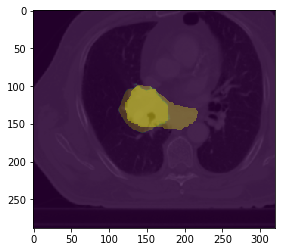

In [268]:
pred = np.load("/output/2d_multi_model/0617-747279_ctv.npy")
gt = data[0]["labels"]["ctv"]
img = data[0]["image"]
print(pred.shape, gt.shape)
i = 80
plt.imshow(img[i])
plt.imshow(pred[i].reshape(288,320), alpha=0.3)
plt.imshow(gt[i].reshape(288,320), alpha=0.3)
plt.show()

In [242]:
# https://gist.github.com/brunodoamaral/e130b4e97aa4ebc468225b7ce39b3137
def dice_coefficient_test(gt, pred, thresh=True):
    """
    Computes the Dice coefficient, a measure of set similarity.
    Parameters
    ----------
    gt : array-like, bool
        Any array of arbitrary size. If not boolean, will be converted.
    pred : array-like, bool
        Any other array of identical size. If not boolean, will be converted.
    Returns
    -------
    dice : float
        Dice coefficient as a float on range [0,1].
        Maximum similarity = 1
        No similarity = 0

    """
    if thresh:
        pred = threshold(pred)
    gt = np.asarray(gt).astype(np.bool)
    pred = np.asarray(pred).astype(np.bool)

    if gt.shape != pred.shape:
        raise ValueError("Shape mismatch: gt and pred must have the same shape.")

    im_sum = gt.sum() + pred.sum()
    if im_sum == 0:
        raise ValueError("Both arrays are empty.")

    # Compute Dice coefficient
    intersection = np.logical_and(gt, pred)

    return 2. * intersection.sum() / im_sum


In [247]:
dice_coefficient_test(gt, pred, thresh=False)

0.963423441243206

In [250]:
def dice_coefficient_np(y_true, y_pred, smooth=1.):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

In [251]:
dice_coefficient_np(gt, pred)

0.9634234542554823

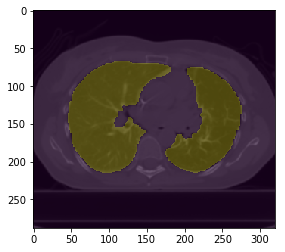

In [218]:
data[1]["labels"]["lung"][34].shape

(288, 320, 1)

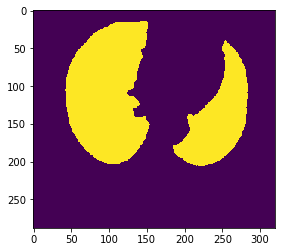

In [174]:
plt.imshow(data["train"]["labels"]["lung"][300].reshape(288,320))

In [179]:
data["train"]["labels"]["lung"][300].max()

1

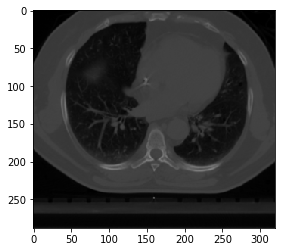

In [176]:
plt.imshow(data["train"]["images"][300])

0_0617-747279
1_0617-748036
test cases :: 2
test image shape :: (160, 288, 320, 3)
test label shape :: (160, 288, 320, 1)


In [158]:
data["images"]

KeyError: 'images'

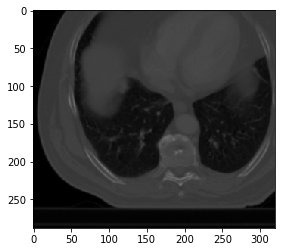

In [154]:
plt.imshow(data[0]["image"][60])

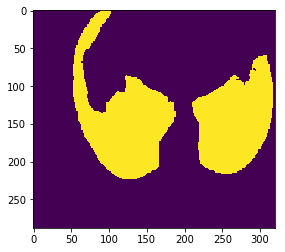

In [155]:
plt.imshow(data[0]["labels"]["lung"][60].reshape(288,320))

In [228]:
def dice_coefficient(y_true, y_pred, smooth=1.):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

In [229]:
def dice_coefficient_np(y_true, y_pred, smooth=1.):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

In [ ]:
dice_coefficient_np

In [231]:
pred = np.load("/output/predictions/test.npy")
pred.shape, pred.min(), pred.max()

((95, 288, 320, 1), 0.0, 1.0)

In [223]:
pred

array([[[[5.8412552e-06],
         [1.1920929e-07],
         [3.2782555e-07],
         ...,
         [2.9802322e-07],
         [1.4901161e-07],
         [5.3942204e-06]],

        [[1.1920929e-07],
         [0.0000000e+00],
         [0.0000000e+00],
         ...,
         [0.0000000e+00],
         [0.0000000e+00],
         [0.0000000e+00]],

        [[2.0861626e-07],
         [0.0000000e+00],
         [0.0000000e+00],
         ...,
         [0.0000000e+00],
         [0.0000000e+00],
         [2.0861626e-07]],

        ...,

        [[2.0861626e-07],
         [0.0000000e+00],
         [0.0000000e+00],
         ...,
         [0.0000000e+00],
         [0.0000000e+00],
         [2.6822090e-07]],

        [[8.9406967e-08],
         [0.0000000e+00],
         [0.0000000e+00],
         ...,
         [0.0000000e+00],
         [0.0000000e+00],
         [1.4901161e-07]],

        [[6.4074993e-06],
         [1.1920929e-07],
         [5.0663948e-07],
         ...,
         [4.7683716e-07],
        

In [222]:
pred.astype(np.bool)

array([[[[ True],
         [ True],
         [ True],
         ...,
         [ True],
         [ True],
         [ True]],

        [[ True],
         [False],
         [False],
         ...,
         [False],
         [False],
         [False]],

        [[ True],
         [False],
         [False],
         ...,
         [False],
         [False],
         [ True]],

        ...,

        [[ True],
         [False],
         [False],
         ...,
         [False],
         [False],
         [ True]],

        [[ True],
         [False],
         [False],
         ...,
         [False],
         [False],
         [ True]],

        [[ True],
         [ True],
         [ True],
         ...,
         [ True],
         [ True],
         [ True]]],


       [[[ True],
         [ True],
         [ True],
         ...,
         [ True],
         [ True],
         [ True]],

        [[False],
         [False],
         [False],
         ...,
         [False],
         [False],
         [Fa

In [108]:
dice(data["test"]["labels"]["cord"], pred)

0.030151514578026412

In [109]:
dice(data["test"]["labels"]["cord"], threshold(pred))

0.8937183860722268

In [110]:
def threshold(pred, thresh=0.5):
    pred[pred<thresh] = 0
    pred[pred>=thresh] = 1
    return pred.astype(np.int8)

def measures(true, pred):
    overlap_measures_filter = sitk.LabelOverlapMeasuresImageFilter()
    overlap_measures_filter.Execute(sitk.GetImageFromArray(true), sitk.GetImageFromArray(pred))
    return overlap_measures_filter.GetDiceCoefficient()

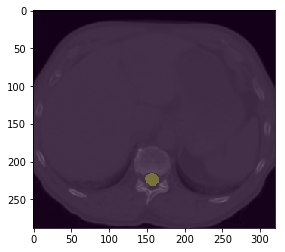

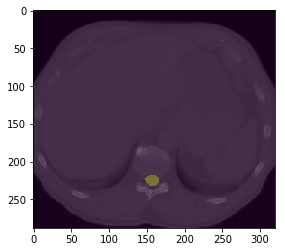

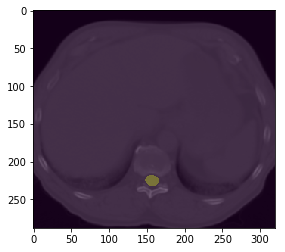

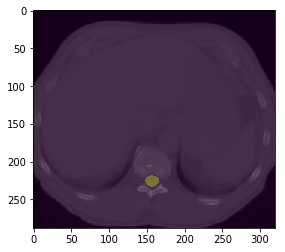

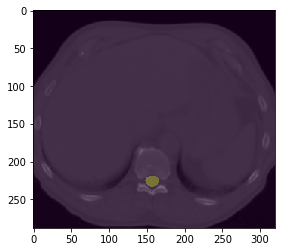

...

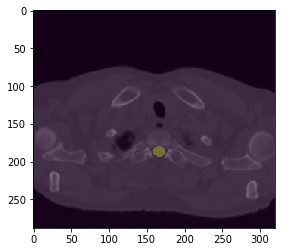

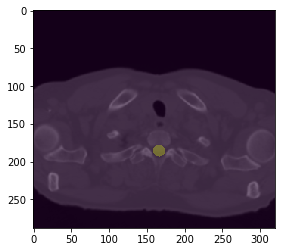

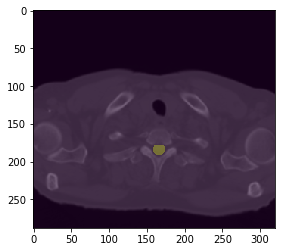

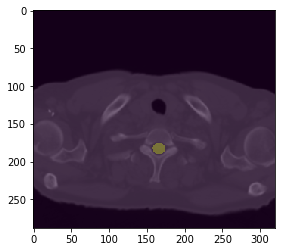

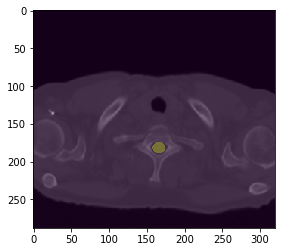

In [111]:
# image = plt.imread("/output/images/image_53_2719.png")
# label = plt.imread("/output/labels/label_53_2719.png")
dices = []
for i in range(95):
    plt.imshow(data["test"]["images"][i])
    plt.imshow(pred[i].reshape(288,320), alpha=0.3)
#     plt.imshow(data["test"]["labels"]["heart"][i].reshape(288,320), alpha=0.3)
#     dices.append(measures(data["test"]["labels"]["heart"][i], threshold(pred[i])))
#     print(measures(data["test"]["labels"]["heart"][i], threshold(pred[i])))
    plt.show()

In [4]:
image = sitk.ReadImage("/mnt/aertslab/DATA/Lung/RTOG_0617/0_processed/14_image_interpolated_resized_rescaled/rtog_0617-309598_image_interpolated_resized_rescaled_xx.nrrd")
arr_image = sitk.GetArrayFromImage(image)
arr_image.shape

(80, 100, 108)

In [60]:
np.mean([ x for x in dices if x != np.inf])

0.9384143744926313

In [71]:
measures(data["test"]["labels"]["lung"].astype(np.float32), threshold(pred).astype(np.float32))

RuntimeError: Exception thrown in SimpleITK LabelOverlapMeasuresImageFilter_Execute: /tmp/SimpleITK/Code/Common/include/sitkMemberFunctionFactory.hxx:196:
sitk::ERROR: Pixel type: vector of 32-bit float is not supported in 3D byN3itk6simple31LabelOverlapMeasuresImageFilterE

In [43]:
from keras import backend as K
def dice_coefficient(y_true, y_pred, smooth=1.):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2 * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

In [73]:
# https://gist.github.com/brunodoamaral/e130b4e97aa4ebc468225b7ce39b3137
def dice(im1, im2):
    """
    Computes the Dice coefficient, a measure of set similarity.
    Parameters
    ----------
    im1 : array-like, bool
        Any array of arbitrary size. If not boolean, will be converted.
    im2 : array-like, bool
        Any other array of identical size. If not boolean, will be converted.
    Returns
    -------
    dice : float
        Dice coefficient as a float on range [0,1].
        Maximum similarity = 1
        No similarity = 0

    Notes
    -----
    The order of inputs for dice is irrelevant. The result will be
    identical if im1 and im2 are switched.
    """
    im1 = np.asarray(im1).astype(np.bool)
    im2 = np.asarray(im2).astype(np.bool)

    if im1.shape != im2.shape:
        raise ValueError("Shape mismatch: im1 and im2 must have the same shape.")

    im_sum = im1.sum() + im2.sum()
    if im_sum == 0:
        raise ValueError("Both arrays are empty.")

    # Compute Dice coefficient
    intersection = np.logical_and(im1, im2)

    return 2. * intersection.sum() / im_sum

0.9731104332826005

In [75]:
pred



array([[[[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        ...,

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]]],


       [[[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        ...,

        [[0.],
 

In [154]:
import numpy as np
import pandas as pd
import SimpleITK as sitk
from collections import defaultdict

df = pd.read_csv("/data/0_curation/rtog_final_curation_ctv.csv")

label_paths = {
    "image": "/data/7_image_interpolated_resized/rtog_{}_image_interpolated_resized_raw_xx.nrrd",
    "lung": "/data/10_lung_interpolated_resized/rtog_{}_lung_interpolated_resized_raw_xx.nrrd",
    "heart": "/data/9_heart_interpolated_resized/rtog_{}_heart_interpolated_resized_raw_xx.nrrd",
    "cord": "/data/11_cord_interpolated_resized/rtog_{}_cord_interpolated_resized_raw_xx.nrrd",
    "esophagus": "/data/8_esophagus_interpolated_resized/rtog_{}_esophagus_interpolated_resized_raw_xx.nrrd",
    "ctv": "/data/12_ctv_interpolated_resized/rtog_{}_ctv_interpolated_resized_raw_xx.nrrd"
}
    
def print_shape(obj, mode):
    print ("{} image shape :: {} \n{} {} label shape :: {}\n{} {} label shape :: {}\n{} {} label shape :: {}\n{} {} label shape :: {}\n{} {} label shape :: {}".format(
        mode, obj["images"].shape, 
        mode, "lung", obj["labels"]["lung"].shape,
        mode, "heart", obj["labels"]["heart"].shape,
        mode, "cord", obj["labels"]["cord"].shape,
        mode, "esophagus", obj["labels"]["esophagus"].shape,
        mode, "ctv", obj["labels"]["ctv"].shape)
          )

def get_arr(patient_id, label):    
    path_to_nrrd = label_paths[label].format(patient_id)
    label = sitk.ReadImage(path_to_nrrd)
    return sitk.GetArrayFromImage(label)
    
def add_slice(label_lists, arr, index, label):
    slice_label = arr[index]
    slice_label = slice_label[6:294,2:322]
    slice_label = slice_label.reshape(288, 320, 1)
    label_lists[label].append(slice_label)

def generate_data(labels, start, end):
    images = []
    label_lists = defaultdict(list)
    # read dataframe
    for idx,pat in enumerate(df["patid"].tolist()[start:end]):
        # read image and get array
        path_to_nrrd = label_paths["image"].format(pat)
        image = sitk.ReadImage(path_to_nrrd)
        arr_image = sitk.GetArrayFromImage(image)
        # read label and get array
        label_arrays = {
            "lung": get_arr(pat, "lung"),
            "heart": get_arr(pat, "heart"),
            "cord": get_arr(pat, "cord"),
            "esophagus": get_arr(pat, "esophagus"),
            "ctv": get_arr(pat, "ctv")
        }  
        counter = 0
        # filter out all blank slices
        for i in range(arr_image.shape[0]):
            # get that slice
            slice_image = arr_image[i]
            if np.unique(slice_image).size != 1:
                counter += 1
                # remap to 0 to 1
                slice_image =  np.interp(slice_image,[-1024,3071],[0,1])
                # slim down slightly so dimensions work with network
                slice_image = slice_image[6:294,2:322]
                # connvert to RGB and append
                slice_image = np.repeat(slice_image.reshape(288, 320, 1), 3, axis=2)
                images.append(slice_image)
                # get label and append
                for l in labels:
                    add_slice(label_lists, label_arrays[l], i, l)

        print ("{}_{}_{}/160".format(idx, pat, counter))

    return {"images": np.array(images), 
            "labels": {
                "lung": np.array(label_lists["lung"]),
                "heart": np.array(label_lists["heart"]),
                "cord": np.array(label_lists["cord"]),
                "esophagus": np.array(label_lists["esophagus"]),
                "ctv": np.array(label_lists["ctv"])
            }
           }


def get_data(labels):
    data = {
        "train": generate_data(labels, 0, 10),
        "tune": generate_data(labels, 300, 301),
        # "test": generate_data(350,426)
    }
    print_shape(data["train"], "train")
    print_shape(data["tune"], "tune")
    # print_shape(data["test"], "test")
    return data

In [155]:
labels = ["lung", "heart", "cord", "esophagus", "ctv"]
data = get_data(labels)

0_0617-259694_93/160
1_0617-305105_127/160
2_0617-308175_160/160
3_0617-313260_156/160
4_0617-342808_132/160
5_0617-349454_132/160
6_0617-355467_141/160
7_0617-359104_127/160
8_0617-368409_143/160
9_0617-380962_160/160
0_0617-697905_160/160
train image shape :: (1371, 288, 320, 3) 
train lung label shape :: (1371, 288, 320, 1)
train heart label shape :: (1371, 288, 320, 1)
train cord label shape :: (1371, 288, 320, 1)
train esophagus label shape :: (1371, 288, 320, 1)
train ctv label shape :: (1371, 288, 320, 1)
tune image shape :: (160, 288, 320, 3) 
tune lung label shape :: (160, 288, 320, 1)
tune heart label shape :: (160, 288, 320, 1)
tune cord label shape :: (160, 288, 320, 1)
tune esophagus label shape :: (160, 288, 320, 1)
tune ctv label shape :: (160, 288, 320, 1)


In [156]:
len(data["train"]["images"])

1371

In [ ]:
2742

In [159]:
42907 / 32
# 4117

1340.84375

In [158]:
1371*2

2742

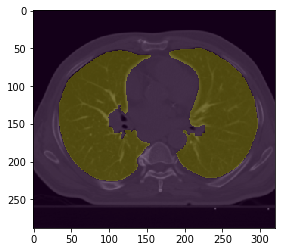

In [145]:
plt.imshow(data["train"]["images"][140])
plt.imshow(data["train"]["labels"]["lung"][140].reshape(288,320), alpha=0.3)
plt.show()

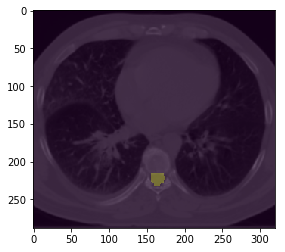

In [149]:
plt.imshow(data["tune"]["images"][80])
plt.imshow(data["tune"]["labels"]["cord"][80].reshape(288,320), alpha=0.3)
plt.show()

In [131]:
160+124+97

381

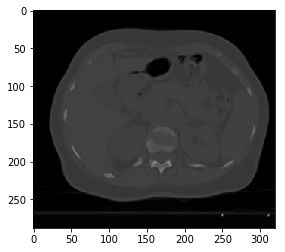

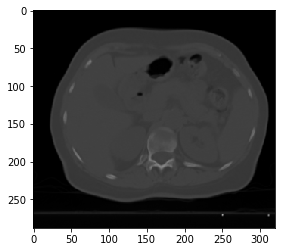

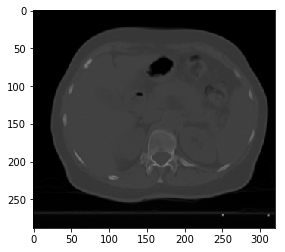

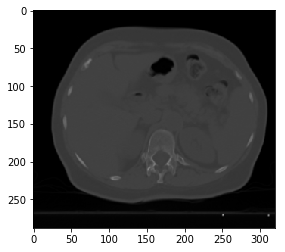

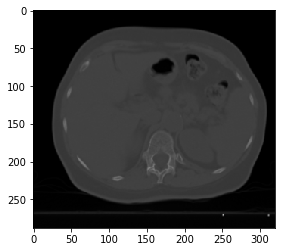

...

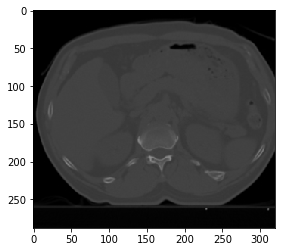

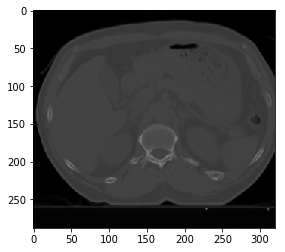

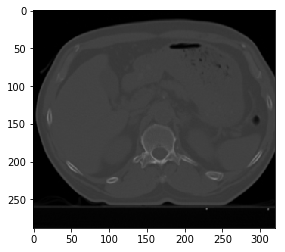

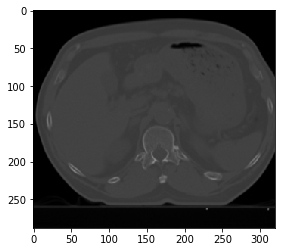

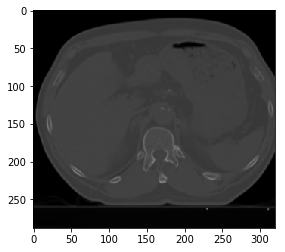

In [78]:
for i in range(0,100):
    plt.imshow(data["train"]["images"][i])
    plt.show()

In [127]:
160*3

480

In [ ]:
import SimpleITK as sitk

imgSitk = sitk.GetImageFromArray(npy)


imgSitk.SetSpacing((1,1,1))
imgSitk.SetDirection(img_direction)
imgSitk.SetOrigin(img_origin)


nrrdWriter = sitk.ImageFileWriter()
nrrdWriter.SetFileName("/folder/file.nrrd")
nrrdWriter.SetUseCompression(True)
nrrdWriter.Execute(sitk_object)